In [1]:
# -*- coding: utf-8 -*-
import quandl
import numpy as np
import statsmodels.api as sm
from scipy import stats
import matplotlib
from matplotlib import cm, pyplot as plt
from hmmlearn.hmm import GaussianHMM
import scipy
import datetime
import json
import seaborn as sns
# from sklearn.externals import joblib
import pandas as pd
import joblib
from backtest_func import yearsharpRatio, maxRetrace, annROR
import copy

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [86]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
# 特征工程和建模
def get_best_hmm_model(X, max_states, max_iter=10000):
    best_score = -(10**10)
    best_state = 0

    for state in range(1, max_states + 1):
        hmm_model = GaussianHMM(n_components=state, random_state=100, covariance_type='diag',
                                n_iter=max_iter).fit(X)
        if hmm_model.score(X) > best_score:
            best_score = hmm_model.score(X)
            best_state = state
    best_model = GaussianHMM(n_components=best_state, random_state=100, covariance_type='diag', n_iter=max_iter).fit(X)
    return best_model

# Normalizde
def std_normallized(vals):
    return np.std(vals) / np.mean(vals)


# Ratio of diff
def ma_ratio(vals):
    return (vals[-1] - np.mean(vals)) / vals[-1]


# z-score
def values_deviation(vals):
    return (vals[-1] - np.mean(vals)) / np.std(vals)

## 获取行情数据

In [4]:
start_date_string = '2017-01-01'
data_path = 'C:/e/data/future_index/'
asset = 'IF'
column_price = 'close'
column_high = 'high'
column_low = 'low'
column_volume = 'volume'
data_ori = pd.read_csv(data_path + asset + '_daily_index.csv')
data_ori['date_time'] = data_ori['date_time'].apply(lambda x: pd.to_datetime(x).strftime('%Y-%m-%d'))
data_ori.index = data_ori['date_time']
data_ori['close_1'] = data_ori['close'].shift(1)

### 原始行情数据

In [5]:
data_ori

,date_time,open,high,low,close,volume,close_1
date_time,,,,,,,
2010-04-16,2010-04-16,3474.055,3514.659,3432.499,3435.308,58457.0,NaN
2010-04-19,2010-04-19,3414.444,3416.017,3186.052,3213.307,123612.0,3435.308
2010-04-20,2010-04-20,3221.567,3254.513,3184.809,3229.914,153419.0,3213.307
2010-04-21,2010-04-21,3231.098,3296.184,3222.858,3282.333,121023.0,3229.914
2010-04-22,2010-04-22,3275.504,3288.689,3226.155,3251.239,140307.0,3282.333
...,...,...,...,...,...,...,...
2020-06-29,2020-06-29,4074.453,4084.480,4029.053,4052.892,91772.0,4087.742
2020-06-30,2020-06-30,4073.957,4125.172,4073.318,4095.624,101466.0,4052.892
2020-07-01,2020-07-01,4109.725,4201.148,4103.437,4189.753,129800.0,4095.624


In [6]:
dataset = data_ori.loc[:, ['open', 'high', 'low', 'close', 'volume']].shift(1)

### 训练全集初始状态

In [7]:
dataset

,open,high,low,close,volume
date_time,,,,,
2010-04-16,NaN,NaN,NaN,NaN,NaN
2010-04-19,3474.055,3514.659,3432.499,3435.308,58457.0
2010-04-20,3414.444,3416.017,3186.052,3213.307,123612.0
2010-04-21,3221.567,3254.513,3184.809,3229.914,153419.0
2010-04-22,3231.098,3296.184,3222.858,3282.333,121023.0
...,...,...,...,...,...
2020-06-29,4064.175,4088.278,4057.200,4087.742,84356.0
2020-06-30,4074.453,4084.480,4029.053,4052.892,91772.0
2020-07-01,4073.957,4125.172,4073.318,4095.624,101466.0


### 构建特征因子

In [8]:
# Feature params
future_period = 1
std_period = 10
ma_period = 10
price_deviation_period = 10
volume_deviation_period = 10
# Create features
cols_features = ['last_return', 'std_normalized', 'ma_ratio', 'price_deviation', 'volume_deviation']
dataset['last_return'] = dataset.loc[:, [column_price]].pct_change()
dataset['std_normalized'] = dataset.loc[:, [column_price]].rolling(std_period).apply(std_normallized, raw=True)
dataset['ma_ratio'] = dataset.loc[:, [column_price]].rolling(ma_period).apply(ma_ratio, raw=True)
dataset['price_deviation'] = dataset.loc[:, [column_price]].rolling(price_deviation_period).apply(values_deviation, raw=True)
dataset['volume_deviation'] = dataset.loc[:, [column_price]].rolling(volume_deviation_period).apply(values_deviation, raw=True)
dataset['future_return'] = dataset.loc[:, [column_price]].pct_change(future_period).shift(-future_period)
dataset = dataset.replace([np.inf, -np.inf], np.nan)
dataset = pd.concat([dataset[cols_features], dataset[['future_return']]], axis=1)

In [9]:
dataset = pd.concat([dataset, data_ori[['high', 'low', 'close', 'volume', 'open', 'date_time', 'close_1']]], axis=1)
#日涨跌幅，模型训练的Y值
dataset['ret'] = dataset['close'] / dataset['open'] - 1
dataset['ret'] = dataset['ret'].fillna(0)
dataset = dataset.dropna()

### 加入特征因子后的全集

In [10]:
dataset

,last_return,std_normalized,ma_ratio,price_deviation,volume_deviation,future_return,high,low,close,volume,open,date_time,close_1,ret
date_time,,,,,,,,,,,,,,
2010-04-30,-0.014021,0.026570,-0.040364,-1.460209,-1.460209,0.006797,3137.126,3062.854,3125.241,193380.0,3121.069,2010-04-30,3104.143,0.001337
2010-05-04,0.006797,0.017822,-0.023420,-1.284054,-1.284054,-0.009188,3113.894,3081.482,3096.525,157571.0,3101.050,2010-05-04,3125.241,-0.001459
2010-05-05,-0.009188,0.020164,-0.029139,-1.404177,-1.404177,-0.000221,3105.629,3052.128,3095.842,153710.0,3068.908,2010-05-05,3096.525,0.008776
2010-05-06,-0.000221,0.021349,-0.025035,-1.144052,-1.144052,-0.033840,3102.218,2978.324,2991.078,181699.0,3097.511,2010-05-06,3095.842,-0.034361
2010-05-07,-0.033840,0.024379,-0.051200,-1.997873,-1.997873,-0.023760,2980.250,2888.371,2920.009,256676.0,2950.777,2010-05-07,2991.078,-0.010427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,0.003263,0.013954,0.020394,1.491981,1.491981,0.009196,4088.278,4057.200,4087.742,84356.0,4064.175,2020-06-24,4050.493,0.005799
2020-06-29,0.009196,0.016602,0.026469,1.637670,1.637670,-0.008525,4084.480,4029.053,4052.892,91772.0,4074.453,2020-06-29,4087.742,-0.005292
2020-06-30,-0.008525,0.016448,0.014723,0.908532,0.908532,0.010544,4125.172,4073.318,4095.624,101466.0,4073.957,2020-06-30,4052.892,0.005318


## 样本内隐状态分析

In [15]:
def analyse_hidden_state_of_single_factor(dataset, factor_list, max_states):
    dataset['date_time'] = pd.to_datetime(dataset['date_time'])
    for i in factor_list:
        net_new = copy.deepcopy(dataset)
        net_new[i] = dataset[i]
        X = np.column_stack([net_new[i]])
        model = get_best_hmm_model(X, max_states)
        hidden_states = model.predict(X)
        plt.figure(figsize=(15, 8))
        plt.rcParams['font.sans-serif'] = ['SimHei']
        for k in range(model.n_components):
            idx = (hidden_states == k)
            idx_int = idx.astype(int)
            net_new['%dth_hidden_state' % k] = idx_int
            net_new['%dth_ret' % k] = net_new['%dth_hidden_state' % k] * net_new['ret']
            net_new['%dth_net' % k] = net_new['%dth_ret' % k].cumsum()
            # print(idx)
            plt.title('特征%s标记在收盘价序列上的隐状态' % i)
            plt.plot_date(net_new['date_time'][idx], net_new['close'][idx], '.', label='%dth hidden state' % k, lw=1)
            
            # plt.legend()
            # plt.grid(1)
        plt.tight_layout()
#         plt.savefig('c:/e/' + 'fig/%s.png' % i)
        plt.figure(figsize=(15, 8))
        colnume_name = ['%dth_net' % k for k in range(model.n_components)]
        colnume_name.append('date_time')
        plt.plot(net_new[colnume_name].set_index(['date_time']))
#         net_new[colnume_name].set_index(['date_time']).plot()
        plt.rcParams['font.sans-serif'] = ['SimHei']
        matplotlib.rcParams['axes.unicode_minus'] = False
        plt.title('特征%s各个隐状态多头累计收益' % i)
        plt.tight_layout()
#         plt.savefig('c:/e/' + 'fig/%s_cum_ret.png' % i)

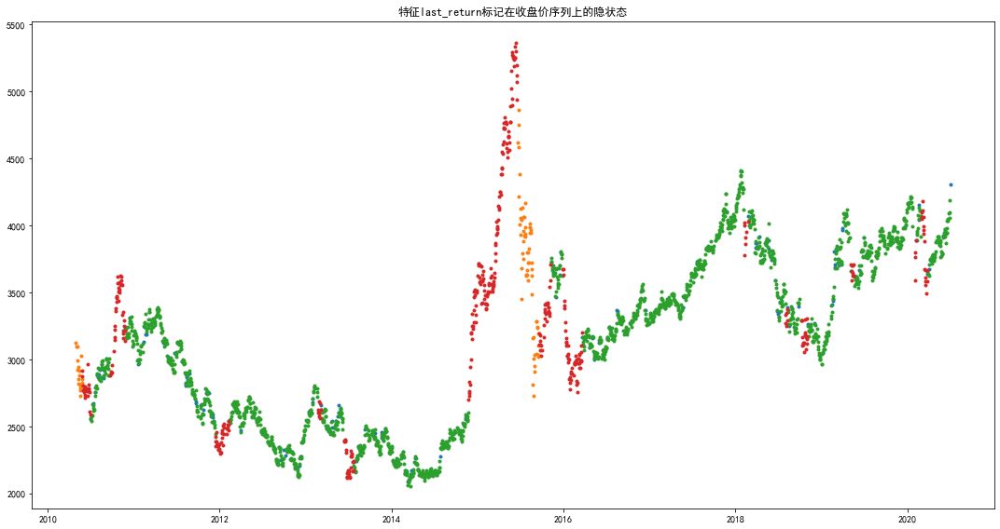

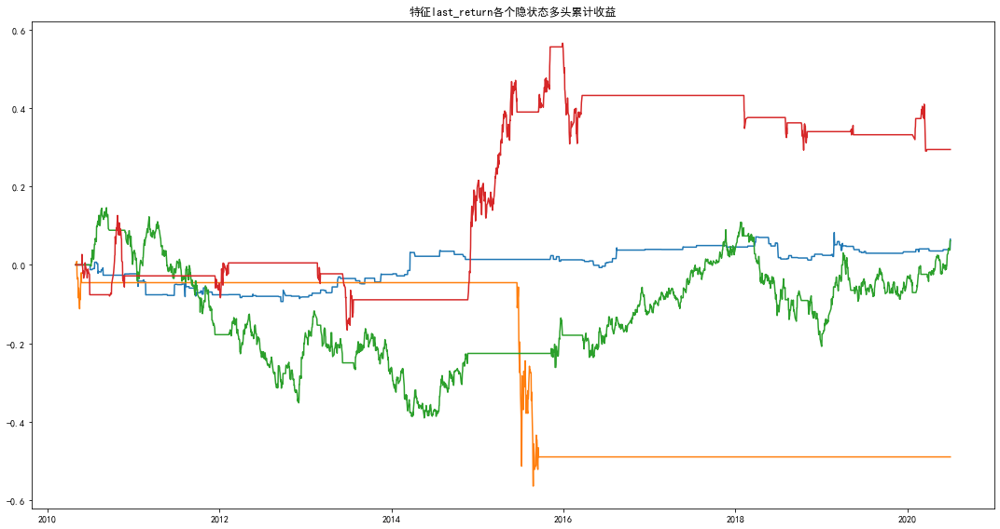

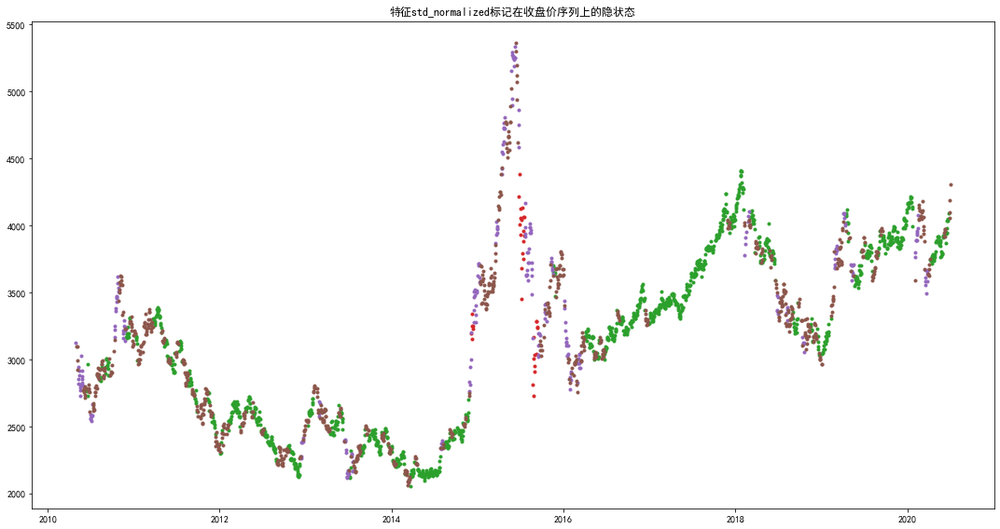

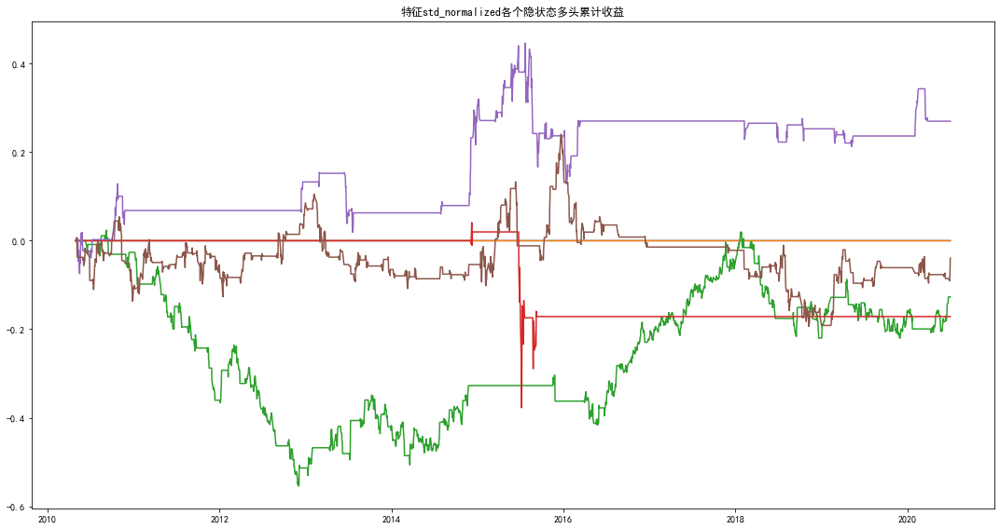

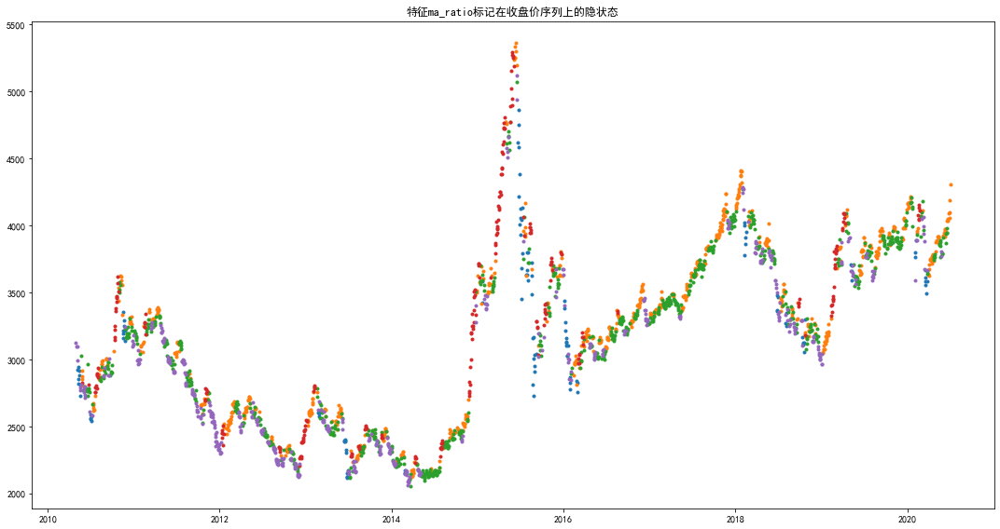

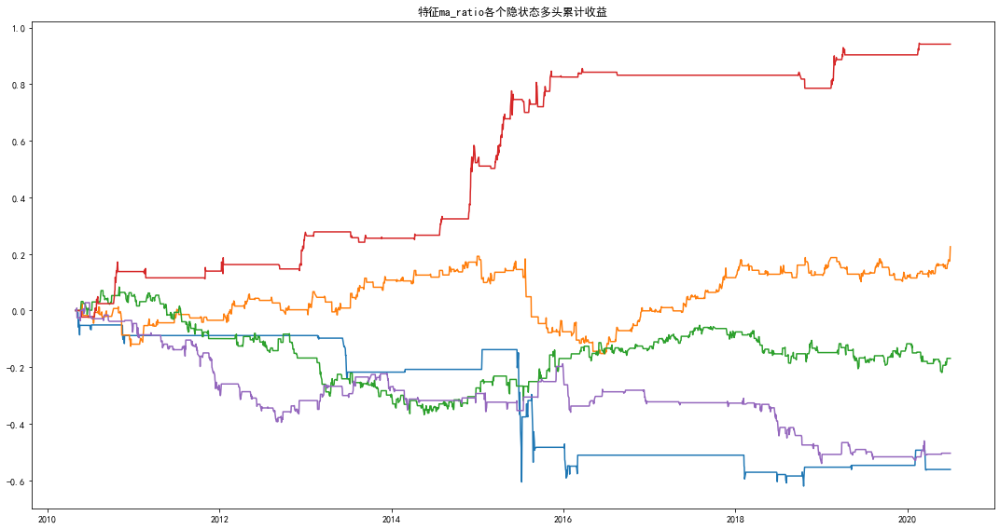

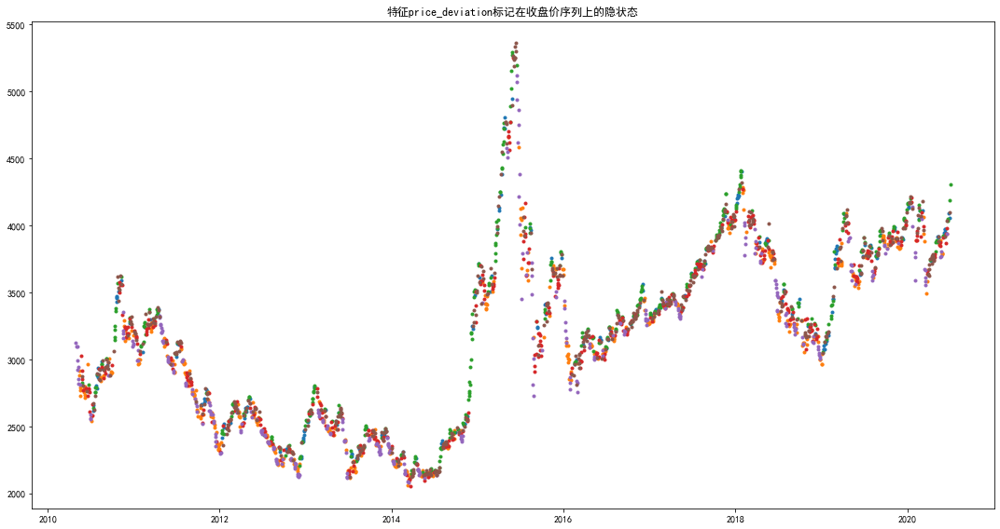

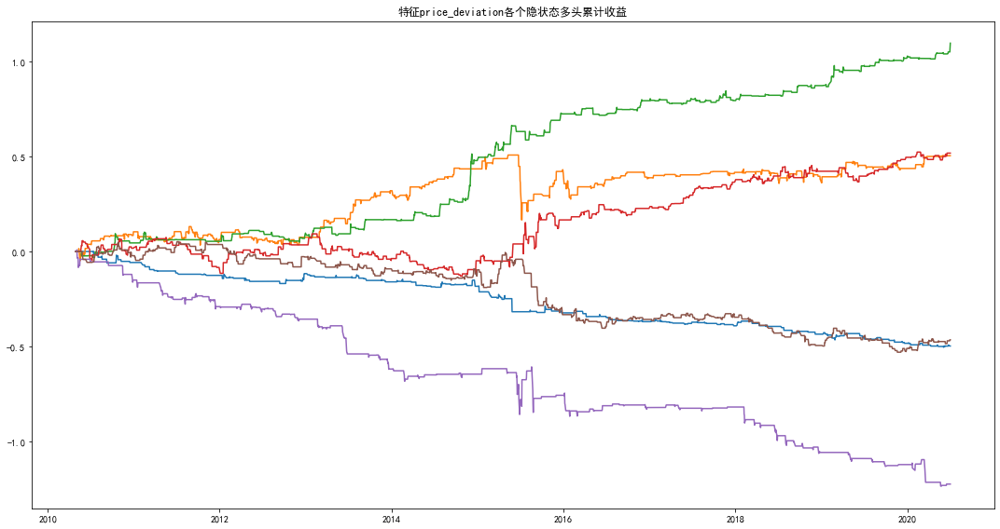

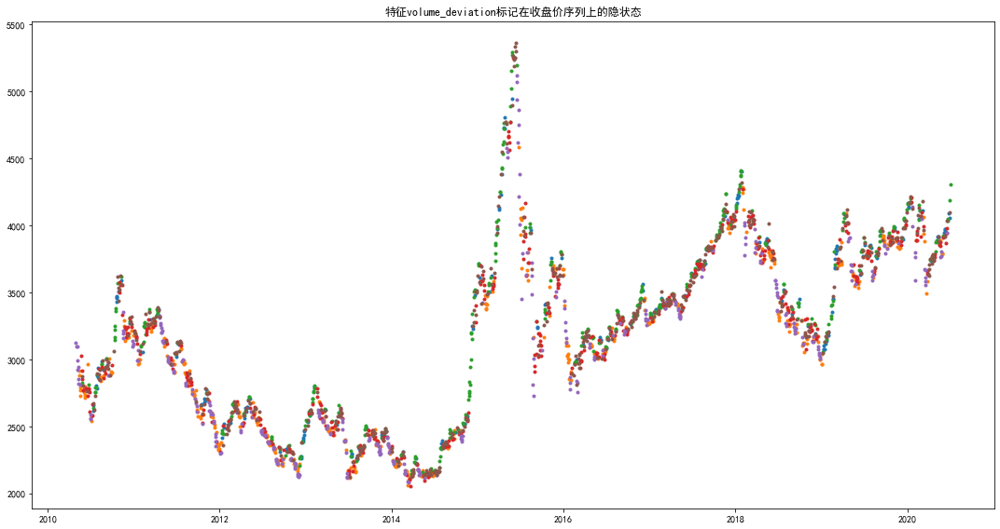

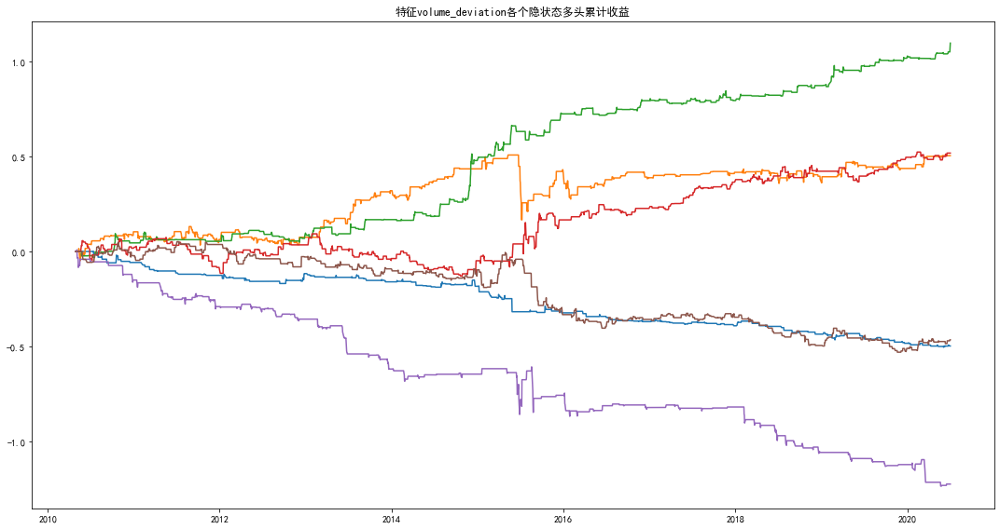

In [16]:
max_states = 6 #隐状态个数设置
analyse_hidden_state_of_single_factor(dataset, cols_features, max_states)

In [120]:
class HmmStrategy(object):
    def __init__(self, max_states, leverage, fee, train_df, test_df, cols_features, train_days=90, test_days=60,
                 insample=False, **kwargs):
        self.test_days=test_days
        self.train_days=train_days
        self.max_states=max_states
        self.leverage=leverage
        self.fee=fee
        self.train_df=train_df
        self.test_df=test_df
        self.cols_features=cols_features
        self.insample = insample
        self.ret = pd.DataFrame()
        self.signal_state_all = pd.DataFrame()
    
    # 隐状态定义涨跌：单一状态下累计损益为正即为看涨信号，反之为看跌信号
    def get_longshort_state_from_cumsum(self, dataset):
        dataset['date_time'] = pd.to_datetime(dataset['date_time'])
        net_new = copy.deepcopy(dataset).dropna()
        X = np.column_stack([net_new.loc[:, self.cols_features]])
        model = self.get_best_hmm_model(X)
        hidden_states = model.predict(X)
        long_states = []
        short_states = []
        random_states = []
        for k in range(model.n_components):
            idx = (hidden_states == k)
            idx_int = idx.astype(int)
            net_new['%dth_hidden_state' % k] = idx_int
            net_new['%dth_ret' % k] = net_new['%dth_hidden_state' % k] * net_new['ret']
            if net_new['%dth_ret' % k].sum() > 0:
                long_states.append(k)
            elif net_new['%dth_ret' % k].sum() < 0:
                short_states.append(k)
            elif net_new['%dth_ret' % k].sum() == 0:
                random_states.append(k)
#         print('做多隐状态：%s, 做空隐状态：%s, 空仓隐状态：%s' %(long_states, short_states, random_states))
        return model, hidden_states, long_states, short_states, random_states
    
    
    def get_best_hmm_model(self, X, max_iter=10000):
        best_score = -(10**10)
        best_state = 0
        for state in range(1, self.max_states + 1):
            hmm_model = GaussianHMM(n_components=state, random_state=100, covariance_type='diag',
                                    n_iter=max_iter).fit(X)
            if hmm_model.score(X) > best_score:
                best_score = hmm_model.score(X)
                best_state = state
        best_model = GaussianHMM(n_components=best_state, random_state=100, covariance_type='diag', n_iter=max_iter).fit(X)
        return best_model
    
    def handle_data(self, test_set, model, hidden_states, long_states, short_states, random_states):
        if self.insample:
            test_set['state'] = hidden_states[-len(test_set):]
        fee = self.fee
        state = None 
        signal_lst = []
        trad_times = 0
        chg = 0
        chg_lst = []
        pos_lst = []
        pos = 0
        low_price_pre = 0
        high_price_pre = 100000000
        long_stop = False
        short_stop = False
        state_lst = []
        for idx, _row in test_set.iterrows():
            test_data = test_set[self.cols_features].loc[:idx, :]
            if self.insample:
                state = _row.state
            else:
                state = int(model.predict(test_set[self.cols_features].loc[:idx, :])[-1])
            state_lst.append(state)
            if pos == 0:
                if state in long_states:
                    pos = 1    
                    cost = _row.open * (1 + fee)
                    s_time = _row.date_time
                    hold_price = []
                    high_price = []
                    hold_price.append(cost/(1+fee))
                    high_price.append(cost/(1+fee))
                    high_price.append(_row.high)
                    chg = (pos * _row.close / cost + (1 - pos)) - 1 
                elif state in short_states:
                    cost = _row.open * (1 - fee)
                    pos = -1
                    s_time = _row.date_time
                    hold_price = []
                    low_price = []
                    hold_price.append(cost/(1-fee))
                    low_price.append(cost/(1-fee))
                    low_price.append(_row.low)
                    chg = ((1 + pos) - pos * (2 - _row.close / cost)) - 1
                else:
                    chg = 0
            elif pos > 0:
                if state in short_states:
                    s_price = _row.open * (1 - fee)
                    trad_times += 1
                    net1 = pos * s_price / _row.close_1 + (1 - pos)
                    ret = s_price / cost - 1
                    e_time = _row.date_time
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(s_price)
                    signal_row.append(ret)
                    signal_row.append((max(high_price) / cost) - 1)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('spk')
                    signal_lst.append(signal_row)
                    s_time = _row.date_time
                    cost = s_price
                    pos = -1
                    net2 = (1 + pos) - pos * (2 - _row.close / cost)
                    hold_price = []
                    low_price = []
                    hold_price.append(cost/(1-fee))
                    low_price.append(cost/(1-fee))
                    low_price.append(_row.low)
                    chg = net1 * net2 - 1
                    short_stop = False
                    long_stop = False
                elif state in random_states:
                    s_price = _row.open * (1 - fee)
                    trad_times += 1
                    net1 = pos * s_price / _row.close_1 + (1 - pos)
                    ret = s_price / cost - 1
                    e_time = _row.date_time
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(s_price)
                    signal_row.append(ret)
                    signal_row.append((max(high_price) / cost) - 1)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('sp')
                    signal_lst.append(signal_row)
                    pos = 0
                    high_price.append(_row.high)
                    long_stop = False
                    short_stop = False
                    chg = net1 - 1
                else:
                    high_price.append(_row.high)
                    hold_price.append(_row.close)
                    chg = (pos * _row.close / _row.close_1 + (1 - pos)) - 1
            elif pos < 0:
                if state in long_states:
                    b_price = _row.open * (1 + fee)
                    e_time = _row.date_time
                    trad_times += 1
                    net1 = (1 + pos) - pos * (2 - b_price / _row.close_1)
                    ret = (cost - b_price) / cost
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(b_price)
                    signal_row.append(ret)
                    signal_row.append((cost - min(low_price)) / cost)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('bpk')
                    signal_lst.append(signal_row)
                    pos = 1
                    cost = b_price
                    net2 = pos * _row.close / cost + 1 - pos
                    s_time = _row.date_time
                    hold_price = []
                    high_price = []
                    hold_price.append(cost/(1+fee))
                    high_price.append(cost/(1+fee))
                    high_price.append(_row.high)
                    chg = net1 * net2 - 1
                    short_stop = False
                    long_stop = False
                elif state in random_states:
                    b_price = _row.open * (1 + fee)
                    trad_times += 1
                    net1 = (1 + pos) - pos * (2 - b_price / _row.close_1)
                    ret = (cost - b_price) / cost
                    e_time = _row.date_time
                    signal_row = []
                    signal_row.append(s_time)
                    signal_row.append(e_time)
                    signal_row.append(cost)
                    signal_row.append(b_price)
                    signal_row.append(ret)
                    signal_row.append((cost - min(low_price)) / cost)
                    signal_row.append(len(hold_price))
                    signal_row.append(pos)
                    signal_row.append('bp')
                    signal_lst.append(signal_row)
                    pos = 0
                    low_price.append(_row.low)
                    long_stop = False
                    short_stop = False
                    chg = net1 - 1

                else:
                    low_price.append(_row.low)
                    hold_price.append(_row.close)
                    chg = ((1 + pos) - pos * (2 - _row.close / _row.close_1)) - 1
            chg_lst.append(chg)
            pos_lst.append(pos)
        ret = test_set.loc[:, ['close', 'date_time']]
        ret['chg'] = chg_lst
        ret['pos'] = pos_lst
        ret['state'] = state_lst
        signal_state_all = pd.DataFrame(signal_lst, columns=[
                                's_time', 'e_time', 'b_price', 's_price', 'ret', 'max_ret', 'hold_day',
                                'position', 'bspk'])
        return ret, signal_state_all

    def _analyze(self):
        # Summary output
        ret = self.ret
        ret.index = pd.to_datetime(ret.index)
        ret['net_close'] = ret['close'] / ret['close'].tolist()[0]
        net_lst = [i/ret['net'].tolist()[0] for i in ret['net'].tolist()]
        annR = annROR(net_lst, 1)
        sharp = yearsharpRatio(net_lst, 1)
        max_retrace = maxRetrace(net_lst, 1)
        
        print('年化收益: ' + str(annR))
        print('夏普比率: ' + str(sharp))
        print('最大回撤: ' + str(max_retrace))

        f = plt.figure(figsize=(15, 15))
        plt.rcParams['font.sans-serif'] = ['SimHei']

        # Plot return
        ax1 = f.add_subplot(211)
        ax1.plot(ret.net, 'blue', label='net_hmm')
        ax1.plot(ret.net_close, 'red', label='net_close')
        ax1.legend()
        ax1.set_title('特征因子%s训练窗口%s净值曲线' %(self.cols_features, self.train_days))
        ax1.set_xlabel('Time')
        ax1.set_ylabel('Value')

        # Plot state
        ax2 = f.add_subplot(212, sharex=ax1)
        ax2.plot(ret.state, 'grey')
        ax2.set_title('特征因子%s隐状态' %self.cols_features)
        ax2.set_xlabel('Time')
        ax2.set_ylabel('Value')
        plt.tight_layout()

    def _get_ret_insample(self):
        self.insample = True
        ret_df = []
        signal_state_all = []
        train_days = self.train_days
        for i in range(0, len(self.train_df), train_days):
            if i+train_days > len(self.train_df):
                train_set = self.train_df.iloc[-train_days:]
                test_set = self.train_df.iloc[i:]
            else:
                train_set = self.train_df.iloc[i:i+train_days]
                test_set = train_set
            model, hidden_states, long_states, short_states, random_states = self.get_longshort_state_from_cumsum(train_set)
            ret, signal_state = self.handle_data(test_set, model, hidden_states, long_states, short_states, random_states)
            ret_df.append(ret)
            signal_state_all.append(ret)
        ret_df = pd.concat(ret_df)
        ret_df['net'] = (1+ret_df['chg']).cumprod()
        signal_state_all = pd.concat(signal_state_all)
        self.ret = ret_df
        self.signal_state_all = signal_state_all
        
    
    def run_insample(self):
        self._get_ret_insample()
        self._analyze()
        
    

# 样本内回测

In [121]:
# 隐状态定义涨跌：单一状态下累计损益为正即为看涨信号，反之为看跌信号
def get_longshort_state_from_cumsum(dataset, factor_list, max_states):
    dataset['date_time'] = pd.to_datetime(dataset['date_time'])
    net_new = copy.deepcopy(dataset).dropna()
    X = np.column_stack([net_new.loc[:, factor_list]])
    model = get_best_hmm_model(X, max_states)
    hidden_states = model.predict(X)
    long_states = []
    short_states = []
    random_states = []
    for k in range(model.n_components):
        idx = (hidden_states == k)
        idx_int = idx.astype(int)
        net_new['%dth_hidden_state' % k] = idx_int
        net_new['%dth_ret' % k] = net_new['%dth_hidden_state' % k] * net_new['ret']
        if net_new['%dth_ret' % k].sum() > 0:
            long_states.append(k)
        elif net_new['%dth_ret' % k].sum() < 0:
            short_states.append(k)
        elif net_new['%dth_ret' % k].sum() == 0:
            random_states.append(k)
    print('做多隐状态：%s, 做空隐状态：%s, 空仓隐状态：%s' %(long_states, short_states, random_states))
    return model, hidden_states, long_states, short_states, random_states

In [66]:
#获取集合的所有子集
def PowerSetsRecursive(items):
    result = [[]]
    for x in items:
        result.extend([subset + [x] for subset in result])
    return result

In [103]:
all_feature_lst = PowerSetsRecursive(cols_features)
all_feature_lst = [i for i in all_feature_lst if len(i)>0]

## 特征因子样本内回测

### 特征因子样本内不同窗口期回测

特征因子： ['price_deviation'] 训练窗口: 60
年化收益: 1.5134041057124605
夏普比率: 3.273720382673363
最大回撤: 0.2676888615902686
特征因子： ['price_deviation'] 训练窗口: 90
年化收益: 1.1384696722936565
夏普比率: 2.689312815211967
最大回撤: 0.20468809747879935
特征因子： ['price_deviation'] 训练窗口: 120
年化收益: 1.0550552107922506
夏普比率: 2.5076460149258137
最大回撤: 0.17114700687913376
特征因子： ['price_deviation'] 训练窗口: 150
年化收益: 1.0096779609633337
夏普比率: 2.4460737656187446
最大回撤: 0.1991990683656164
特征因子： ['price_deviation'] 训练窗口: 180
年化收益: 0.9766281384473683
夏普比率: 2.4155564192344645
最大回撤: 0.2941719470278239
特征因子： ['price_deviation'] 训练窗口: 210
年化收益: 0.8205068313368655
夏普比率: 2.1418242595985606
最大回撤: 0.2566951673578566
特征因子： ['price_deviation'] 训练窗口: 240
年化收益: 0.6218785015225066
夏普比率: 1.7059786671599309
最大回撤: 0.26825728170307495
特征因子： ['price_deviation'] 训练窗口: 270
年化收益: 0.7103103953880914
夏普比率: 1.8980150345419922
最大回撤: 0.267491983050694
特征因子： ['price_deviation'] 训练窗口: 300
年化收益: 0.7100403044550618
夏普比率: 1.8817365297109936
最大回撤: 0.2566951673578567


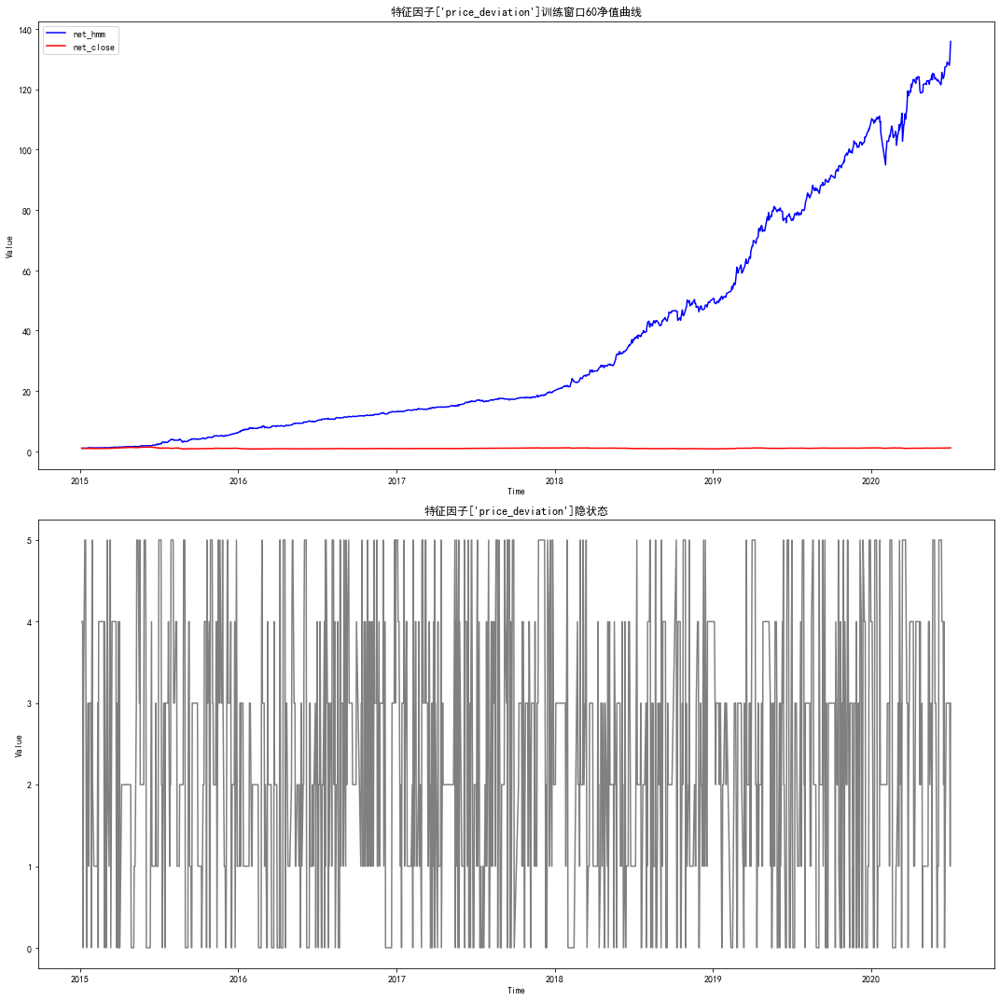

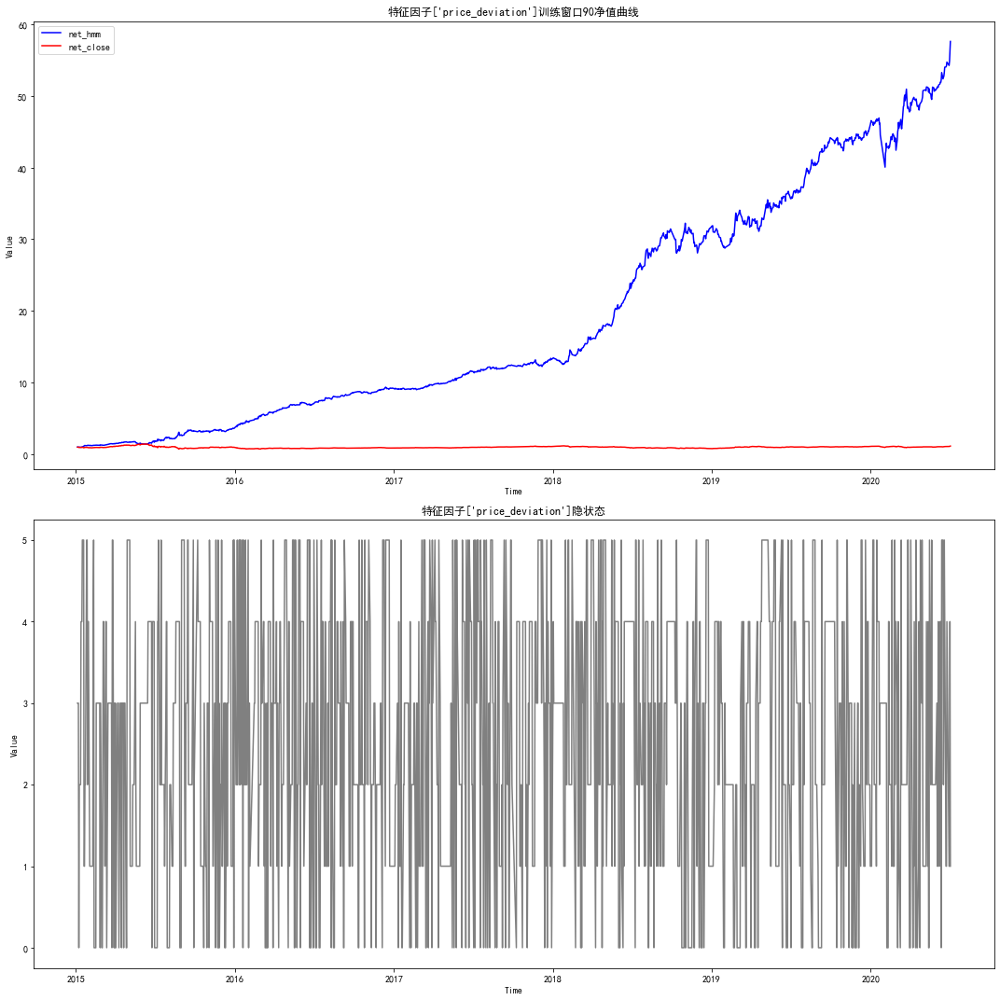

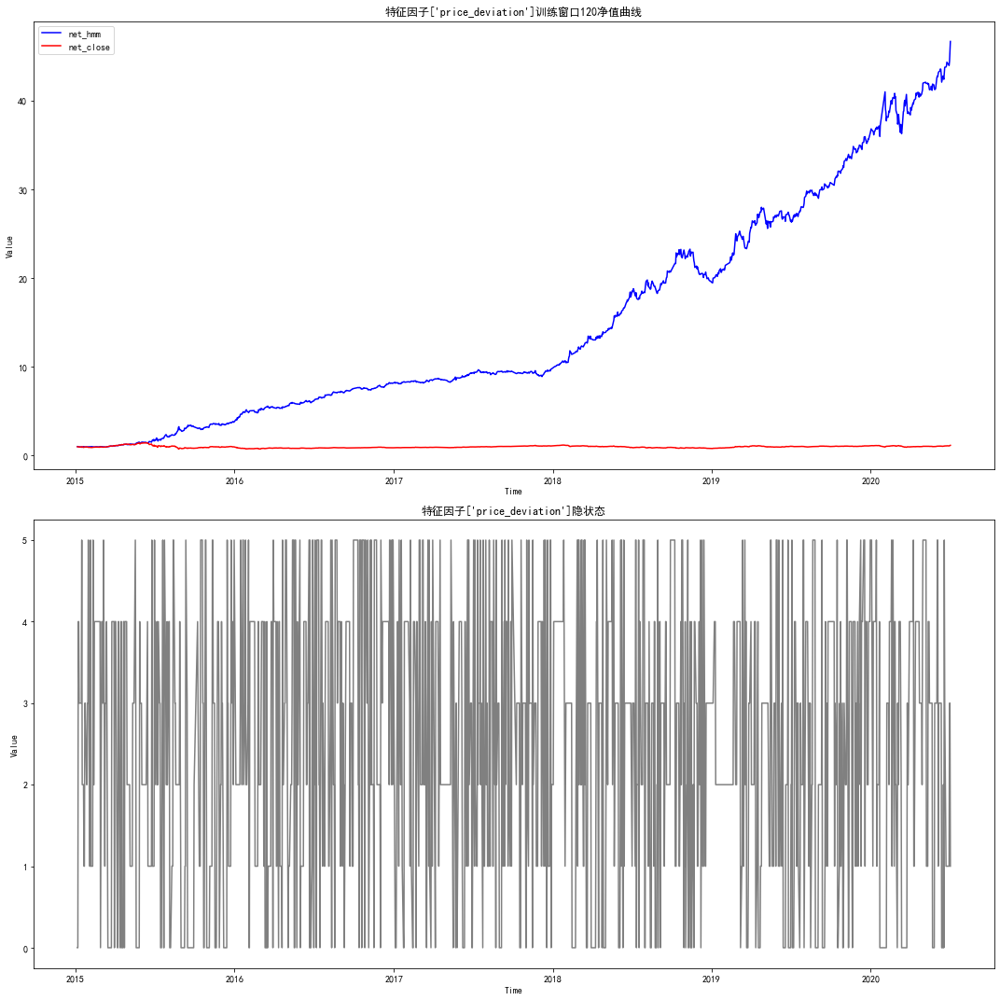

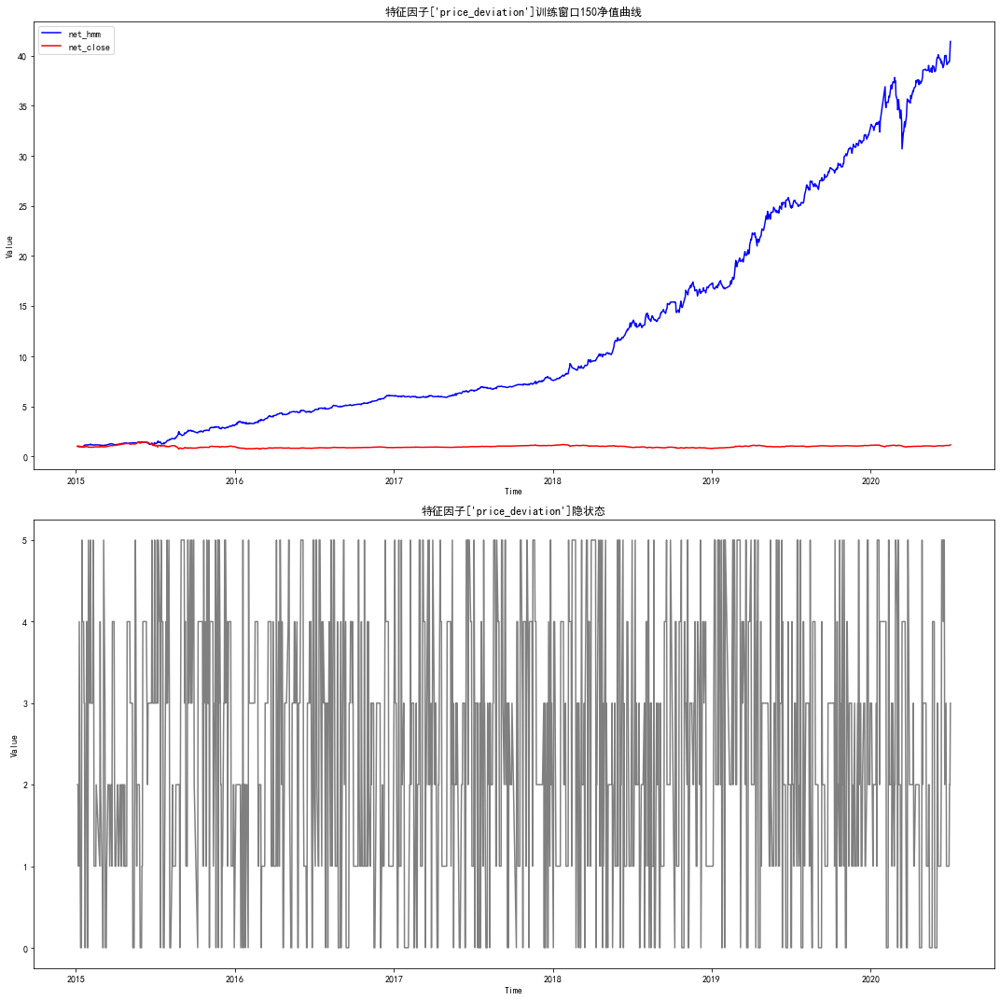

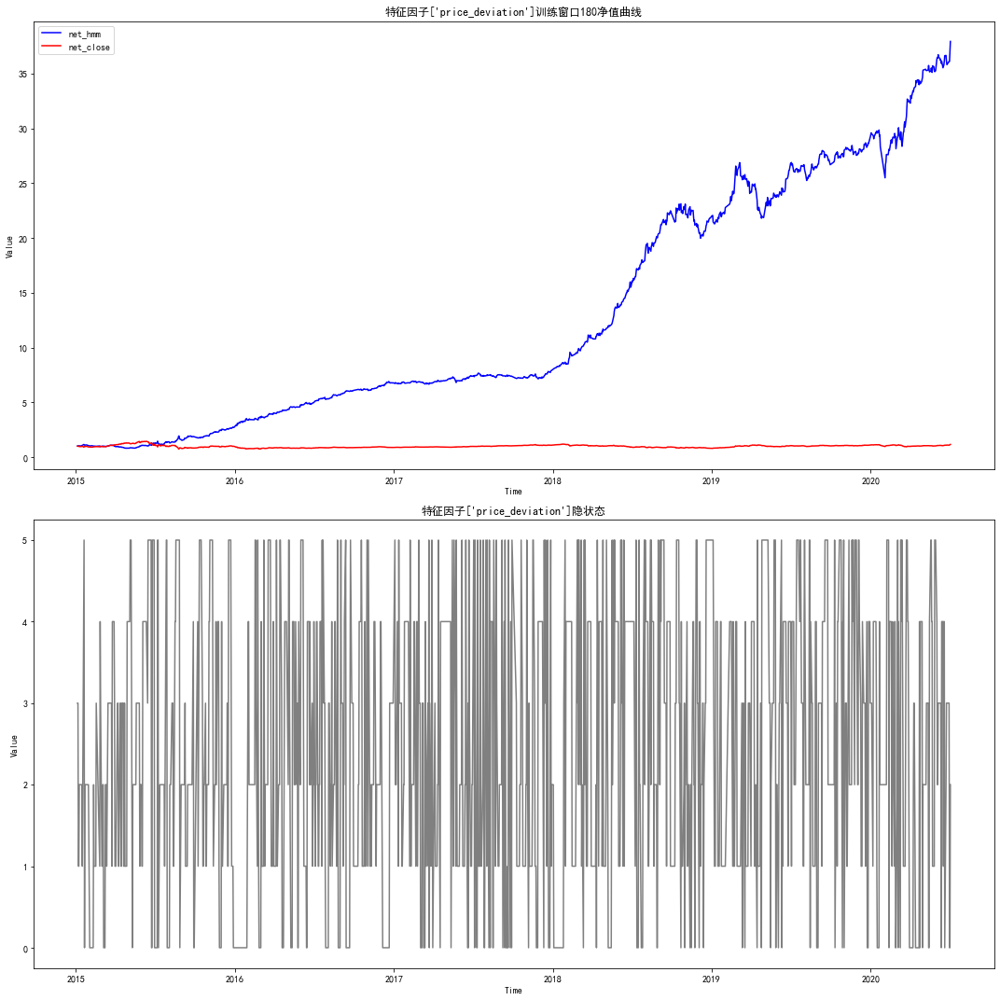

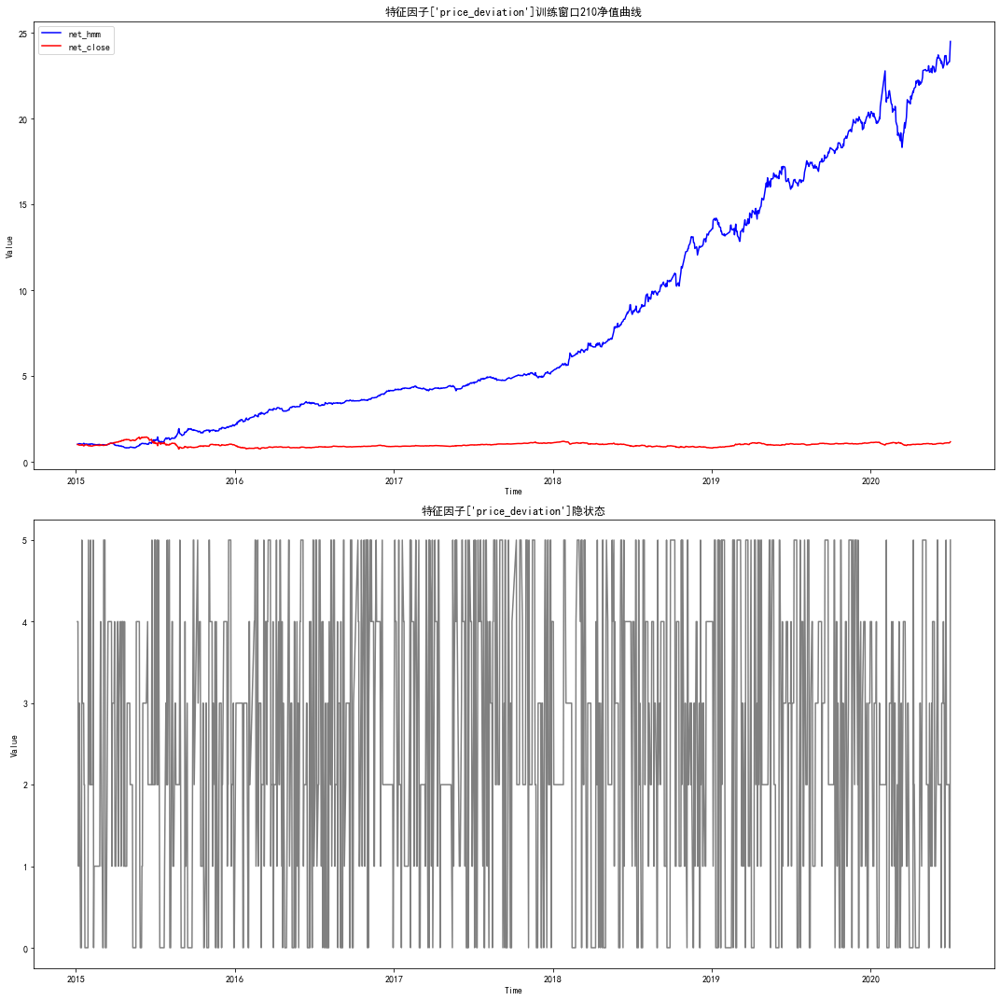

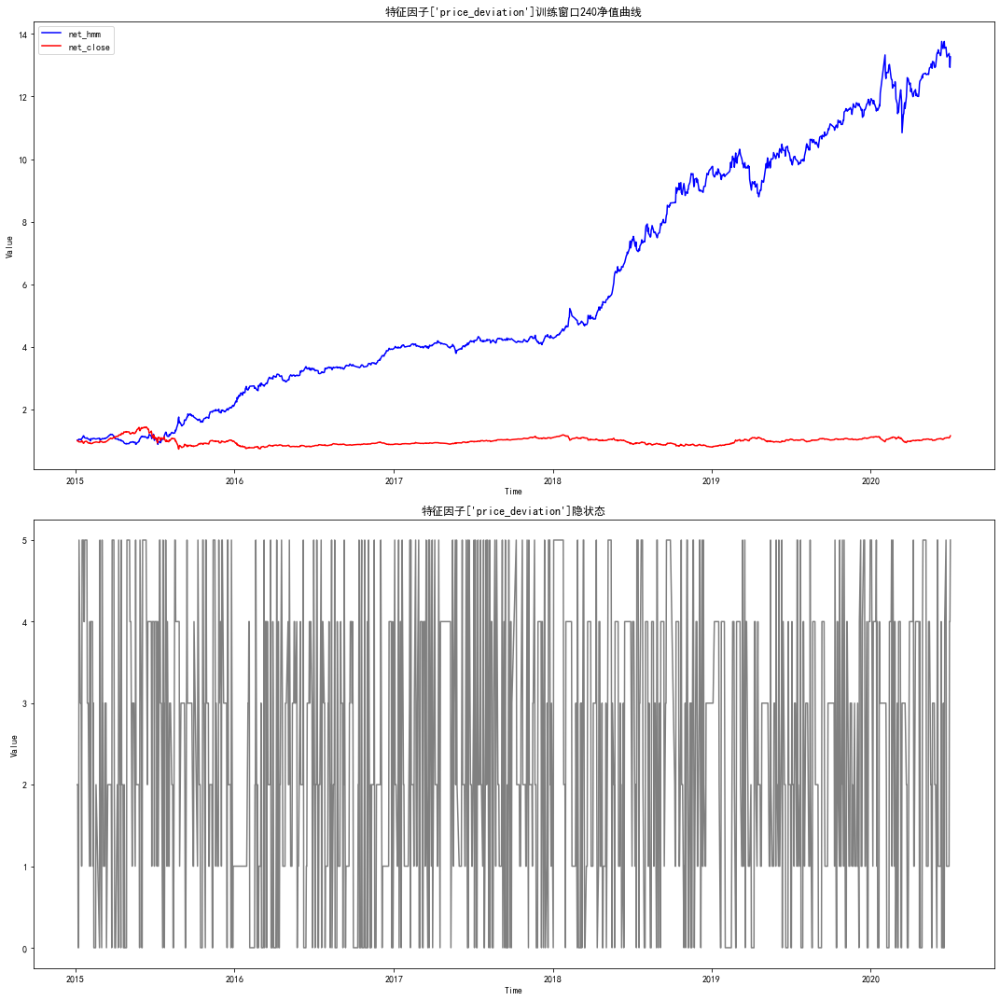

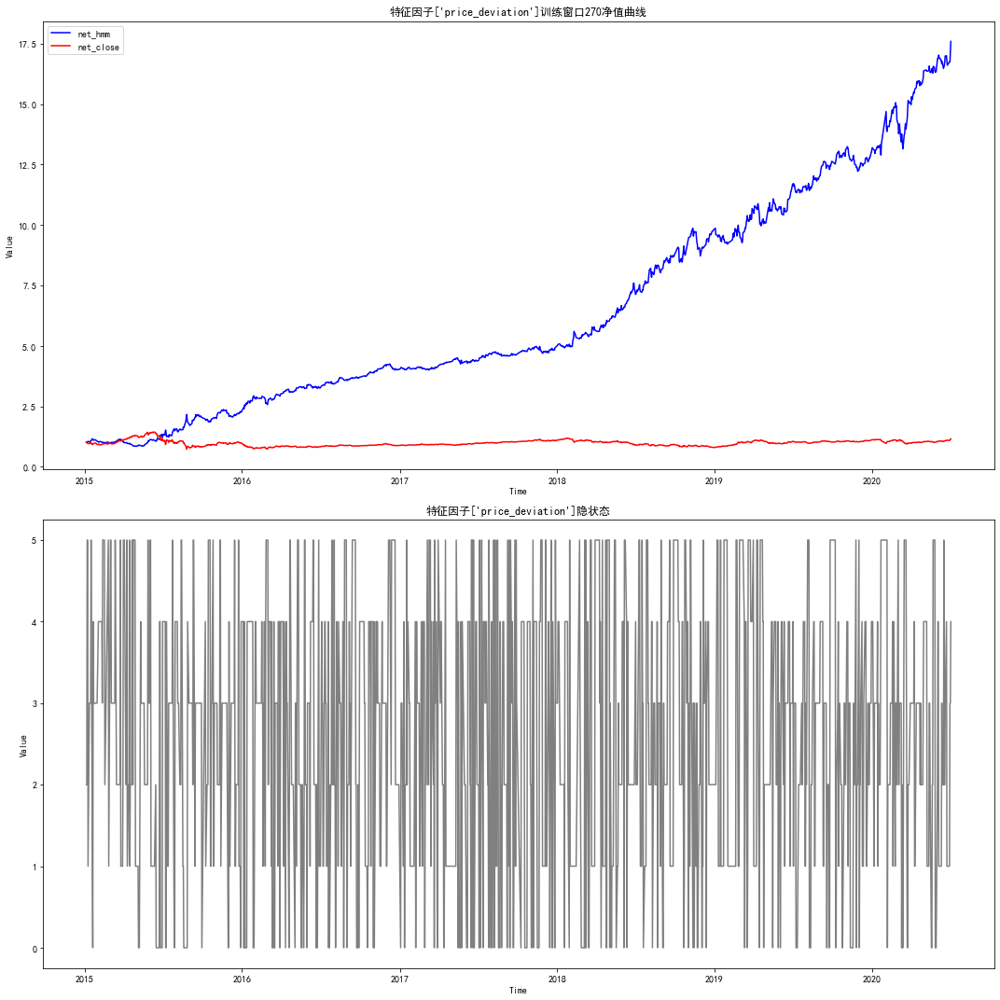

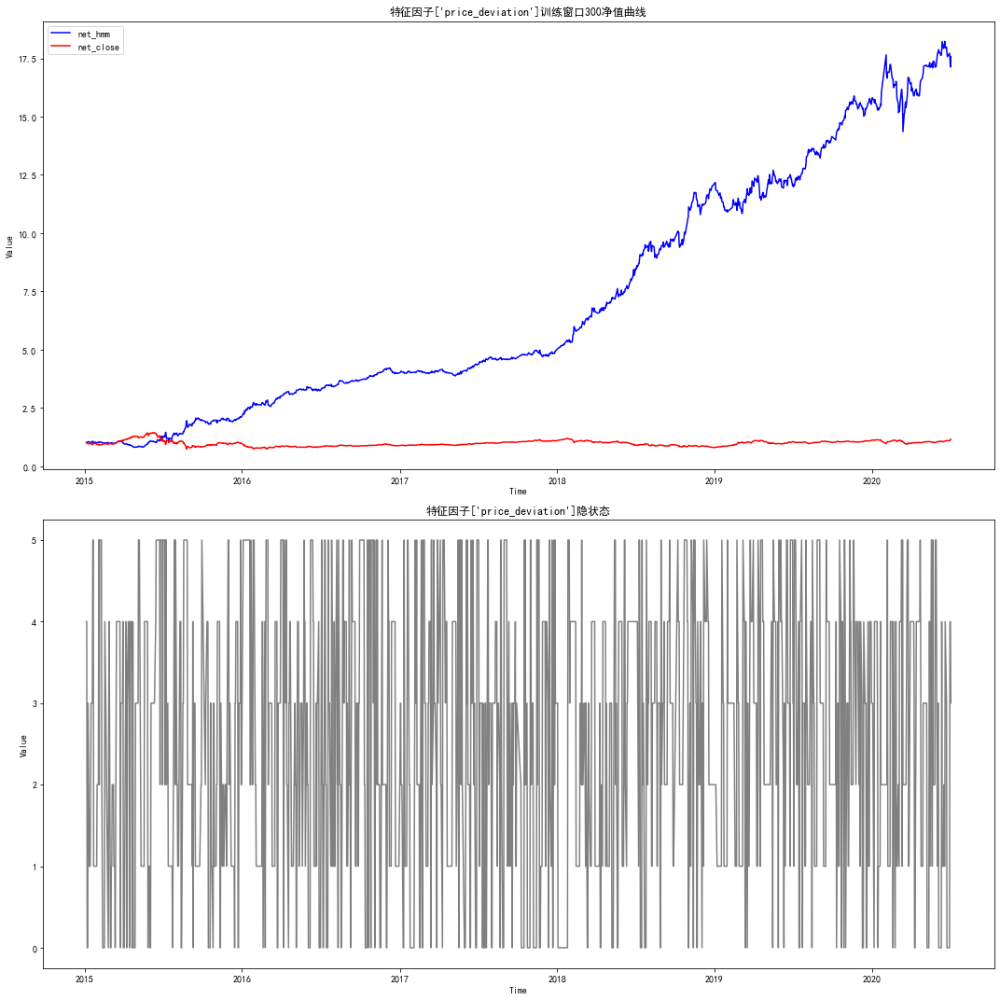

In [122]:
in_sample_dataset = dataset[dataset.index >= '2015-01-01'].dropna()
train_days = len(in_sample_dataset)
test_days = len(in_sample_dataset)
all_feature_lst = [['price_deviation']]
for feature_lst in all_feature_lst:
    for train_days in range(60, 301, 30):
        print('特征因子：', feature_lst, '训练窗口:', train_days)
        strategy_obj = HmmStrategy(max_states=max_states, leverage=1, fee=0.0002, train_df=in_sample_dataset, test_df=in_sample_dataset, 
                                   cols_features=feature_lst, train_days=train_days, test_days=test_days, insample=True)
        strategy_obj.run_insample()

### 样本内不同特征因子回测

特征因子： ['last_return'] 训练窗口: 90
年化收益: 0.2765991875987839
夏普比率: 0.8532798672632964
最大回撤: 0.2804891247106006
特征因子： ['std_normalized'] 训练窗口: 90
年化收益: 0.2639577931746464
夏普比率: 0.8087022417548474
最大回撤: 0.2804891247106006
特征因子： ['last_return', 'std_normalized'] 训练窗口: 90
年化收益: 0.2639577931746464
夏普比率: 0.8087022417548474
最大回撤: 0.2804891247106006
特征因子： ['ma_ratio'] 训练窗口: 90
年化收益: 0.4087446061199911
夏普比率: 1.194691214193078
最大回撤: 0.17170144364165307
特征因子： ['last_return', 'ma_ratio'] 训练窗口: 90
年化收益: 0.6360716872308005
夏普比率: 1.689876365681861
最大回撤: 0.16016111603385774
特征因子： ['std_normalized', 'ma_ratio'] 训练窗口: 90
年化收益: 0.37197620637416096
夏普比率: 1.1045899611008045
最大回撤: 0.19679858311866594
特征因子： ['last_return', 'std_normalized', 'ma_ratio'] 训练窗口: 90
年化收益: 0.38056442408900537
夏普比率: 1.1295177090569832
最大回撤: 0.20640005325933153
特征因子： ['price_deviation'] 训练窗口: 90
年化收益: 1.1384696722936565
夏普比率: 2.689312815211967
最大回撤: 0.20468809747879935
特征因子： ['last_return', 'price_deviation'] 训练窗口: 90
年化收益: 1.10905619417

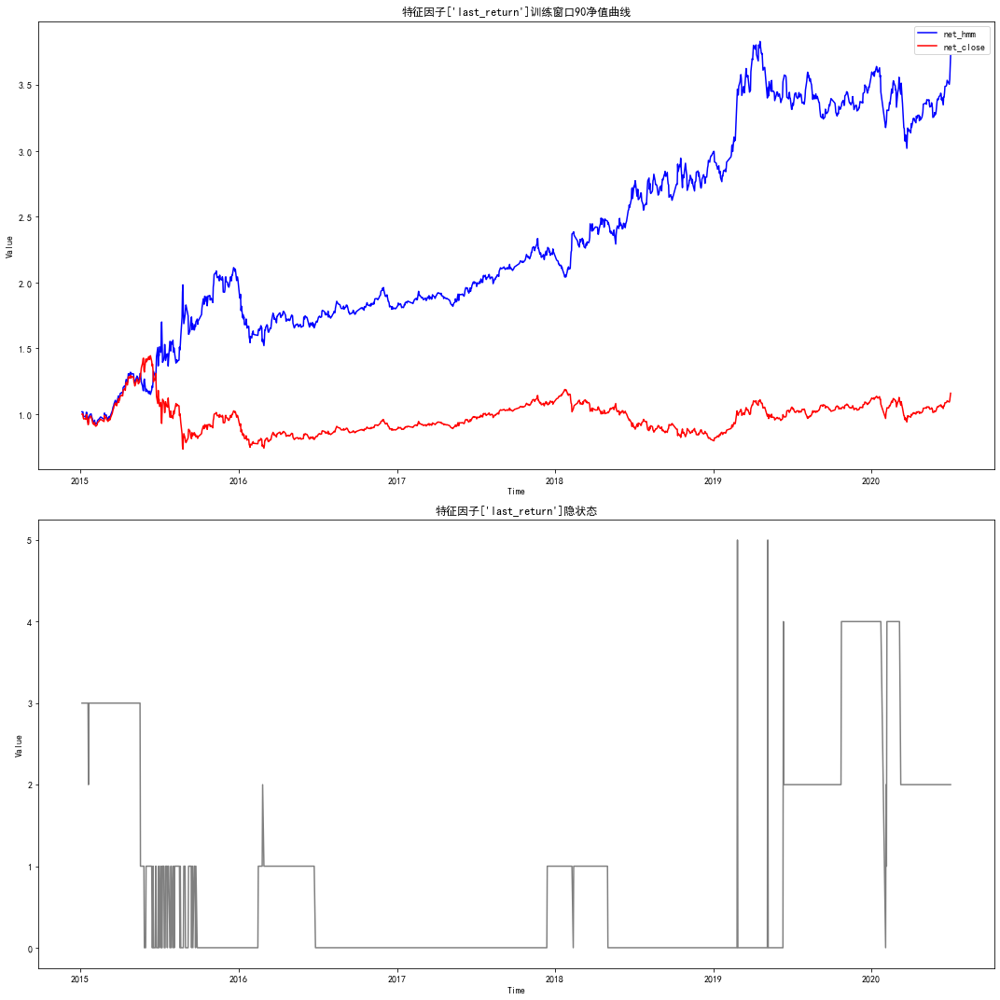

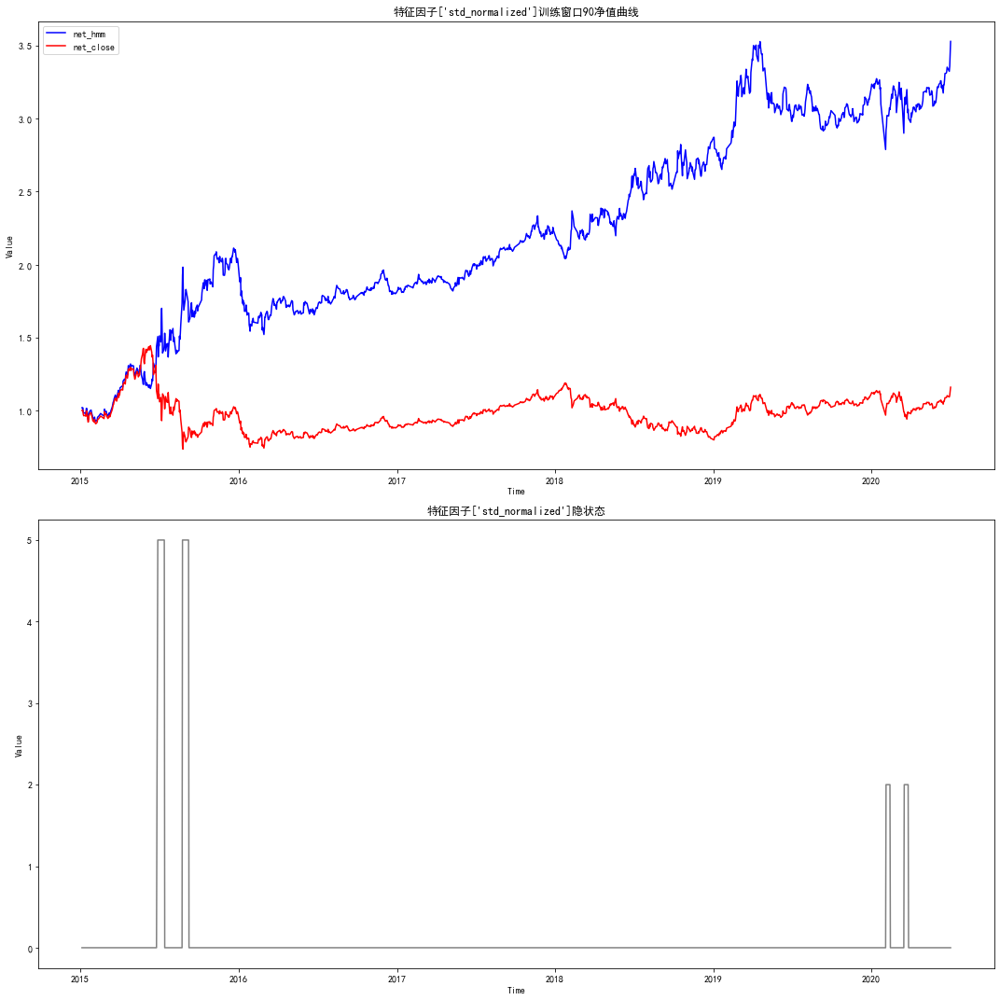

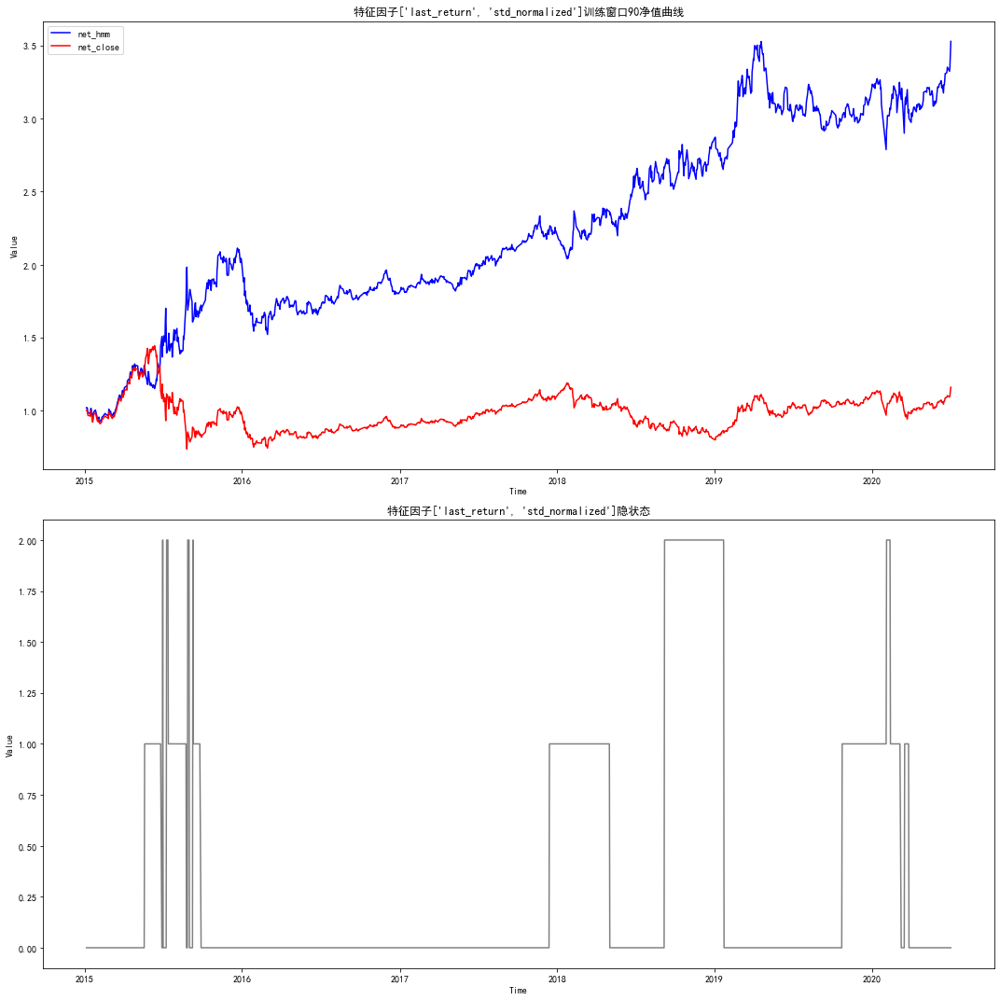

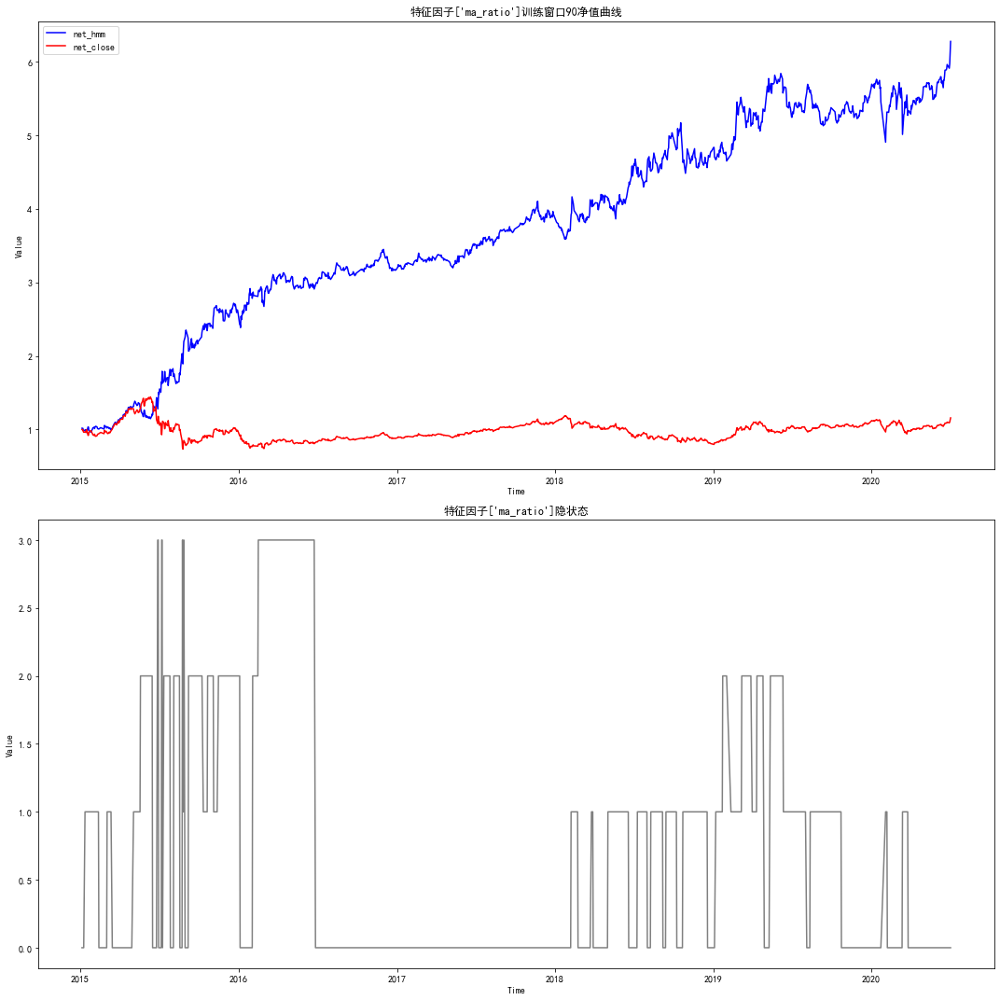

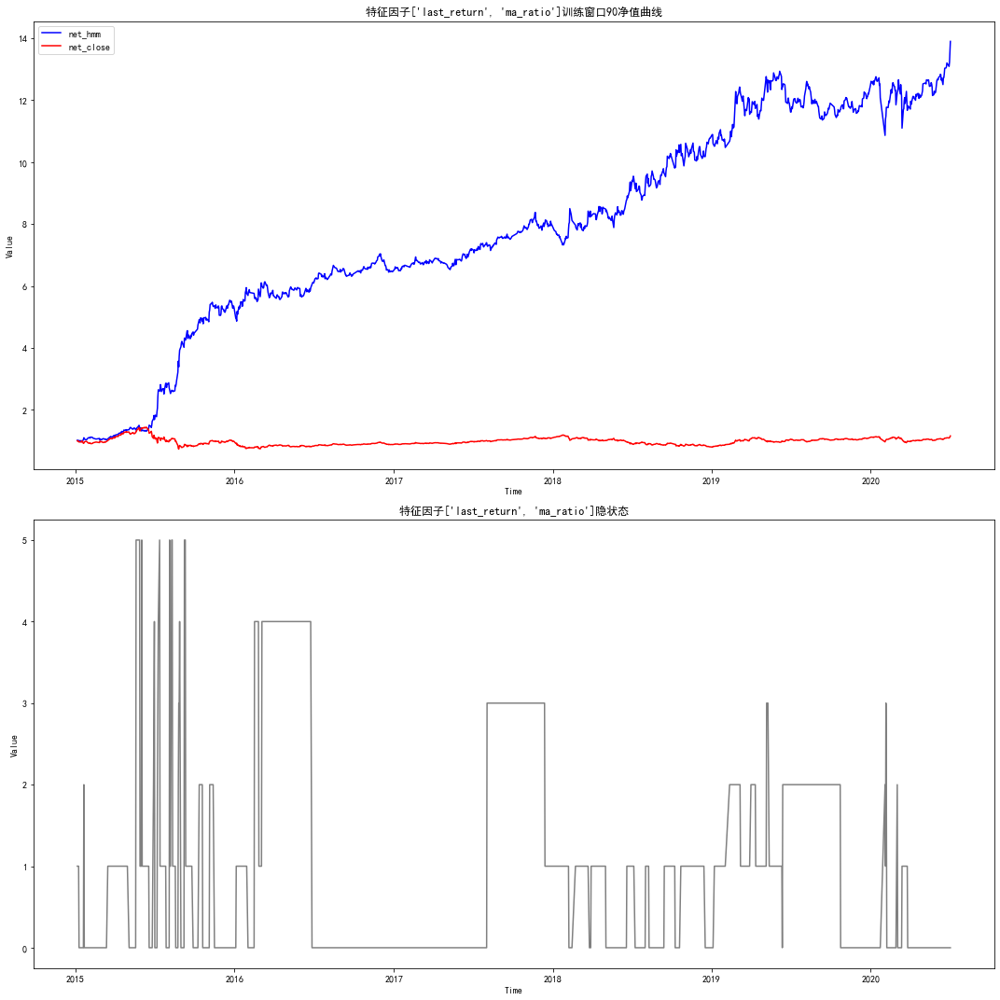

...

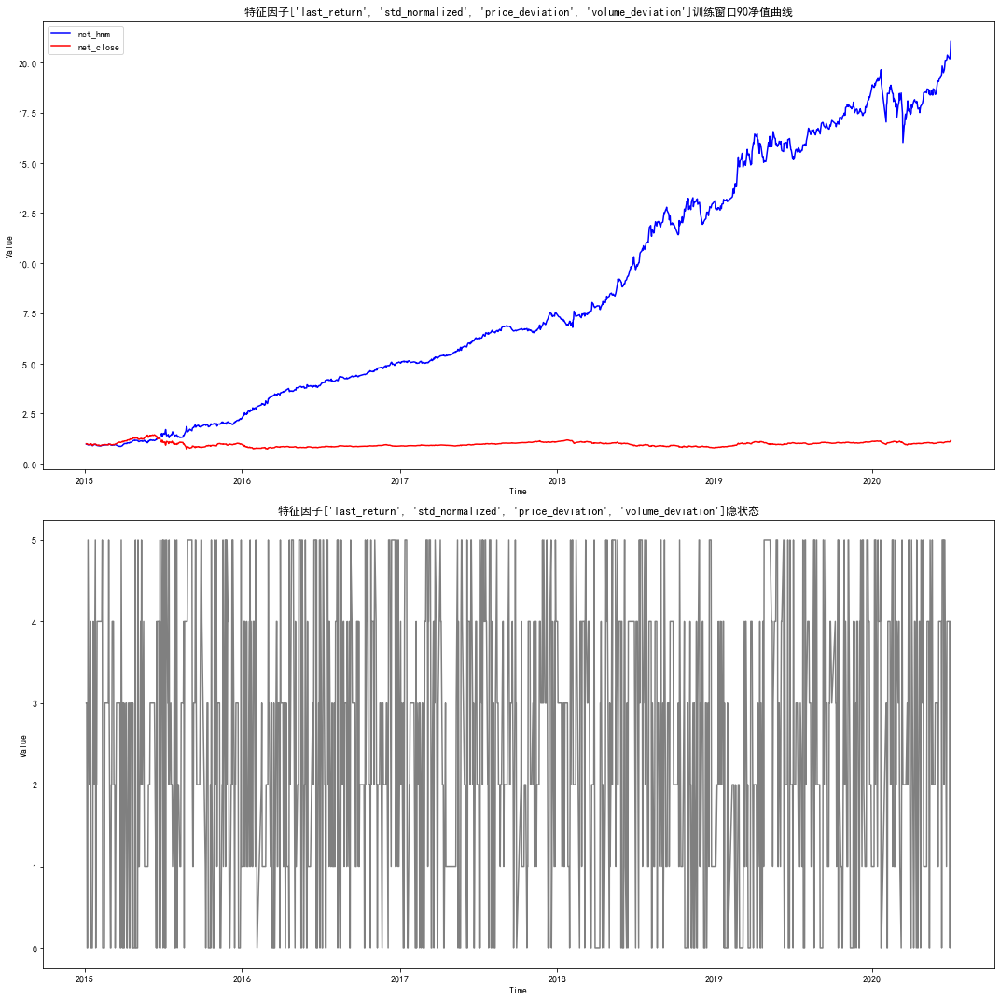

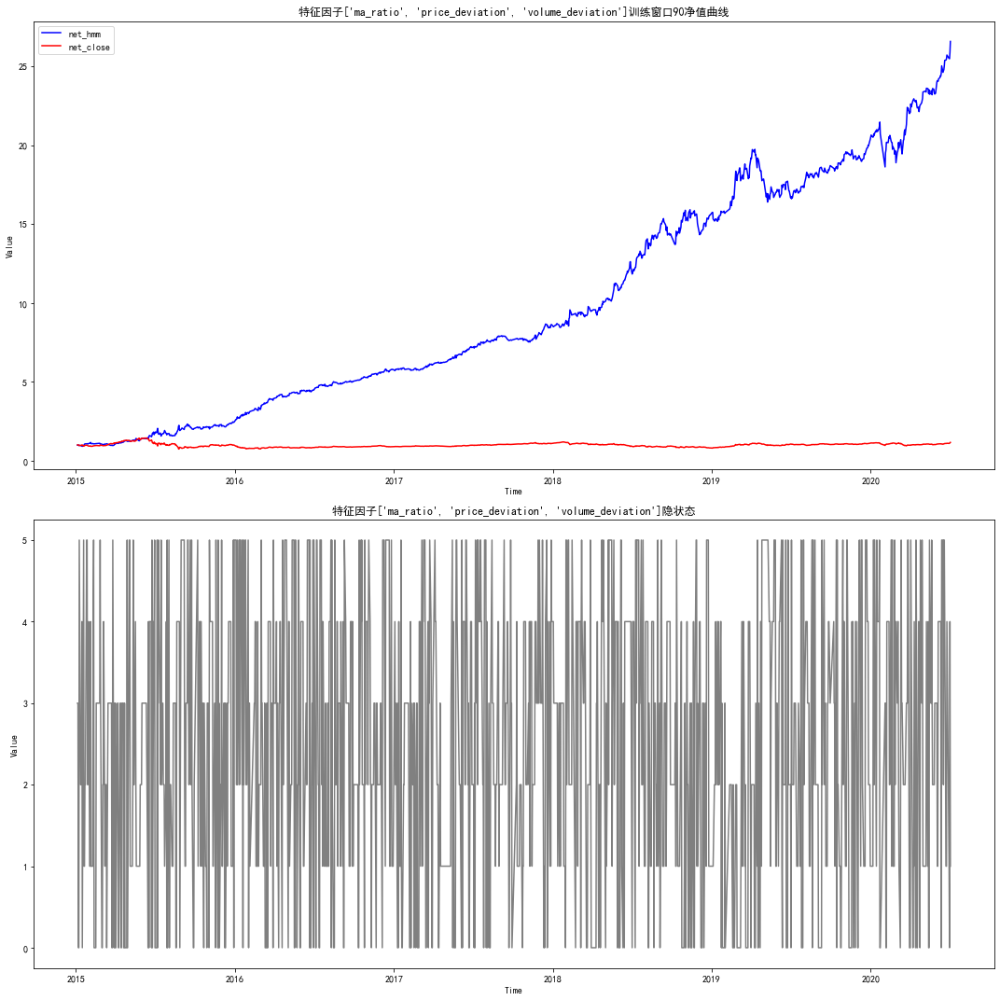

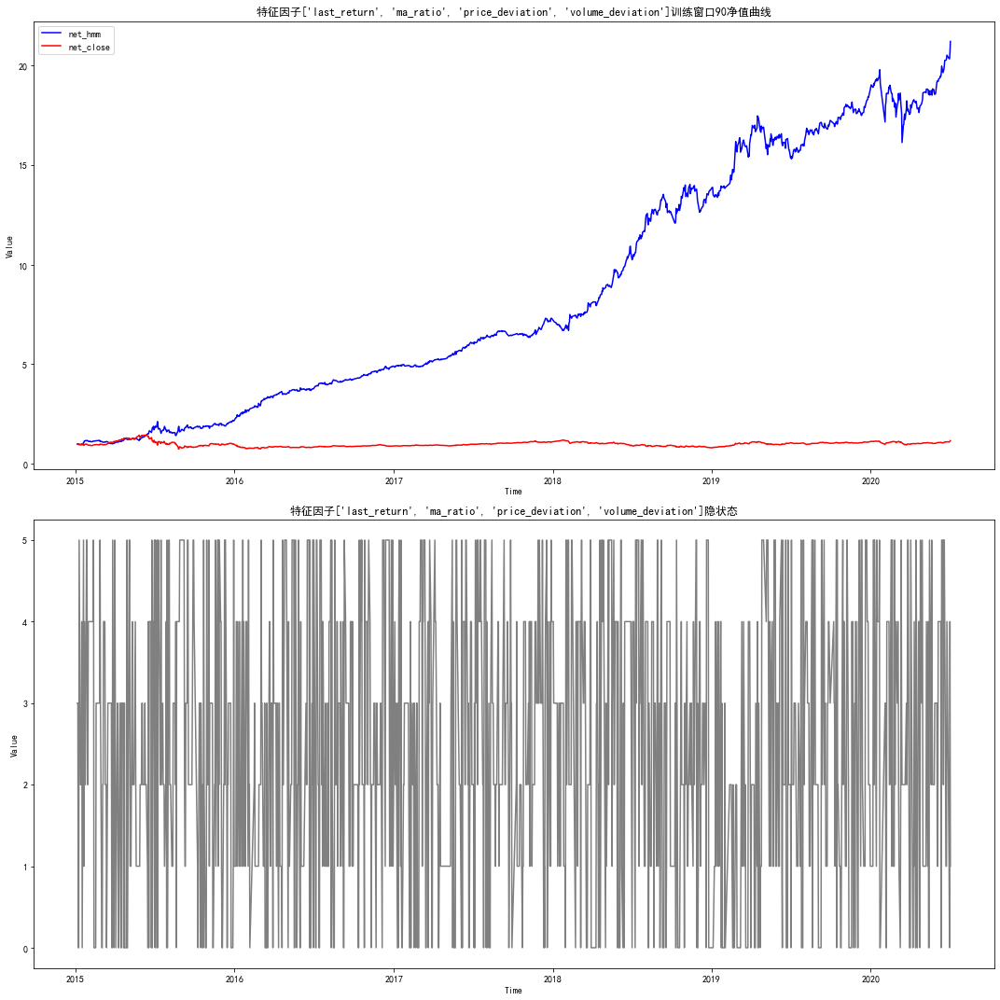

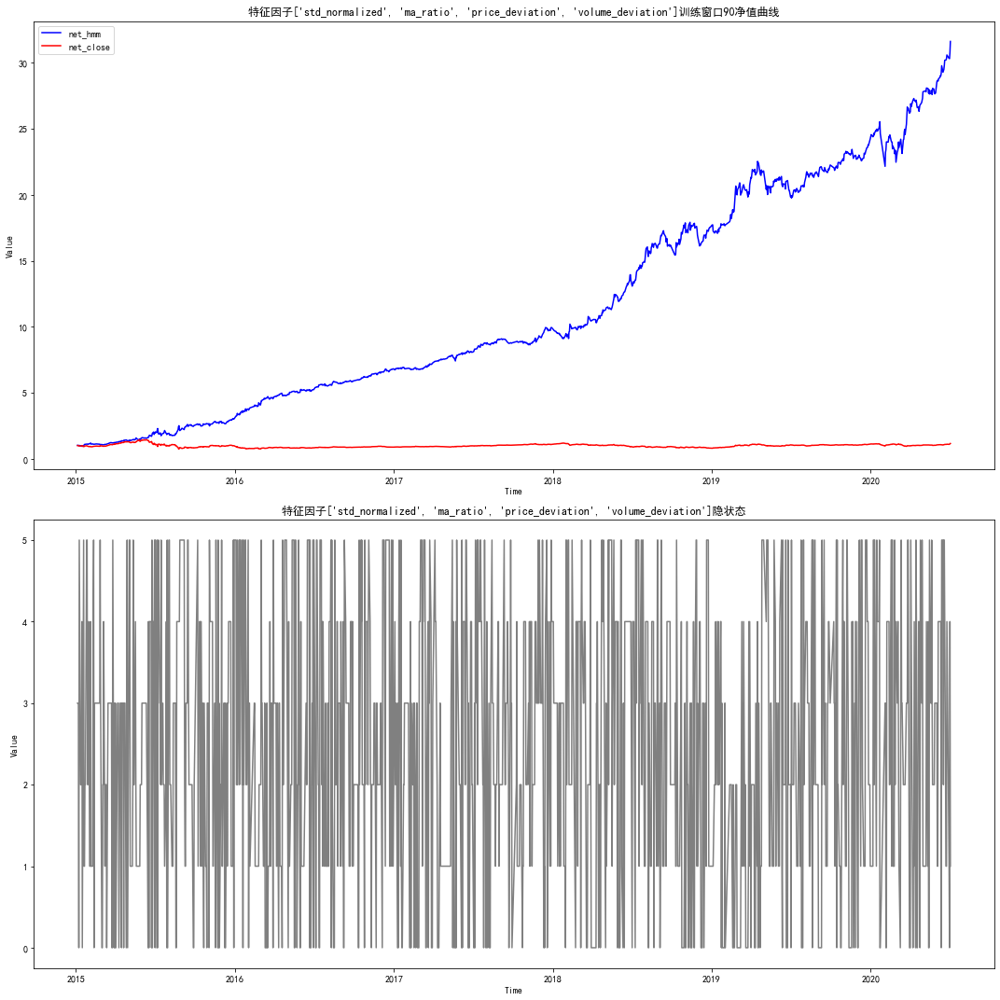

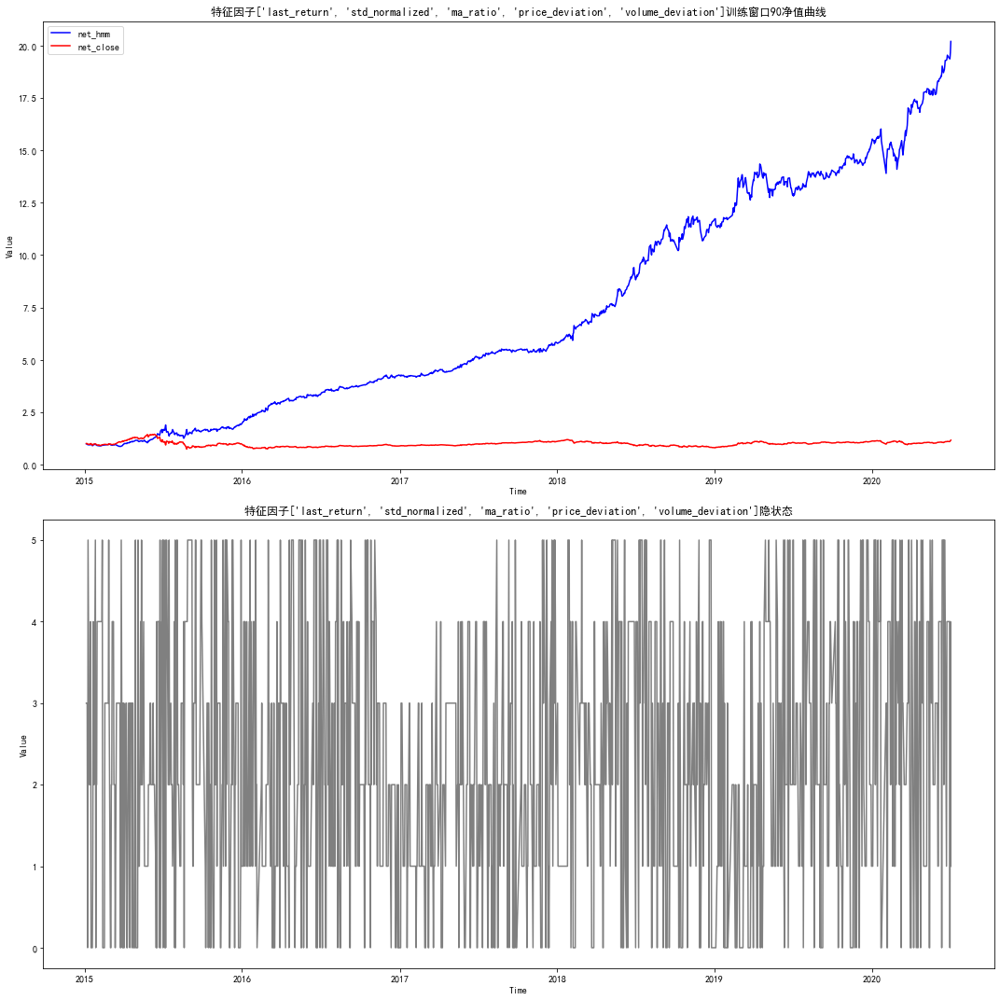

In [123]:
all_feature_lst = PowerSetsRecursive(cols_features)
all_feature_lst = [i for i in all_feature_lst if len(i)>0]
in_sample_dataset = dataset[dataset.index >= '2015-01-01'].dropna()
train_days = 90
test_days = len(in_sample_dataset)
for feature_lst in all_feature_lst:
    print('特征因子：', feature_lst, '训练窗口:', train_days)
    strategy_obj = HmmStrategy(max_states=max_states, leverage=1, fee=0.0002, train_df=in_sample_dataset, test_df=in_sample_dataset, 
                               cols_features=feature_lst, train_days=train_days, test_days=test_days, insample=True)
    strategy_obj.run_insample()

特征因子： ['last_return']
做多隐状态：[0, 3], 做空隐状态：[1, 2], 空仓隐状态：[]
年化收益: 0.25428804376809166
夏普比率: 0.7858352918791239
最大回撤: 0.2815702184587412
特征因子： ['std_normalized']
做多隐状态：[0, 1], 做空隐状态：[2], 空仓隐状态：[]
年化收益: 0.15047584253503454
夏普比率: 0.4875210744480851
最大回撤: 0.32788976901358635
特征因子： ['last_return', 'std_normalized']
做多隐状态：[0, 1], 做空隐状态：[3, 4], 空仓隐状态：[2, 5]
年化收益: 0.1649924509330949
夏普比率: 0.5266156938965322
最大回撤: 0.4497573479228023
特征因子： ['ma_ratio']
做多隐状态：[0, 2, 4], 做空隐状态：[1, 3], 空仓隐状态：[]
年化收益: 0.17850905241383352
夏普比率: 0.5702536524372054
最大回撤: 0.4133300402685576
特征因子： ['last_return', 'ma_ratio']
做多隐状态：[2, 3, 4], 做空隐状态：[0, 1, 5], 空仓隐状态：[]
年化收益: 0.3127255849770625
夏普比率: 0.9445965177537328
最大回撤: 0.22630749905182634
特征因子： ['std_normalized', 'ma_ratio']
做多隐状态：[2, 3], 做空隐状态：[0, 1, 4, 5], 空仓隐状态：[]
年化收益: 0.1714338578596919
夏普比率: 0.549365575802779
最大回撤: 0.3380673689729462
特征因子： ['last_return', 'std_normalized', 'ma_ratio']
做多隐状态：[2, 4], 做空隐状态：[0, 1, 3, 5], 空仓隐状态：[]
年化收益: 0.39077322443835016
夏普比率: 1.15

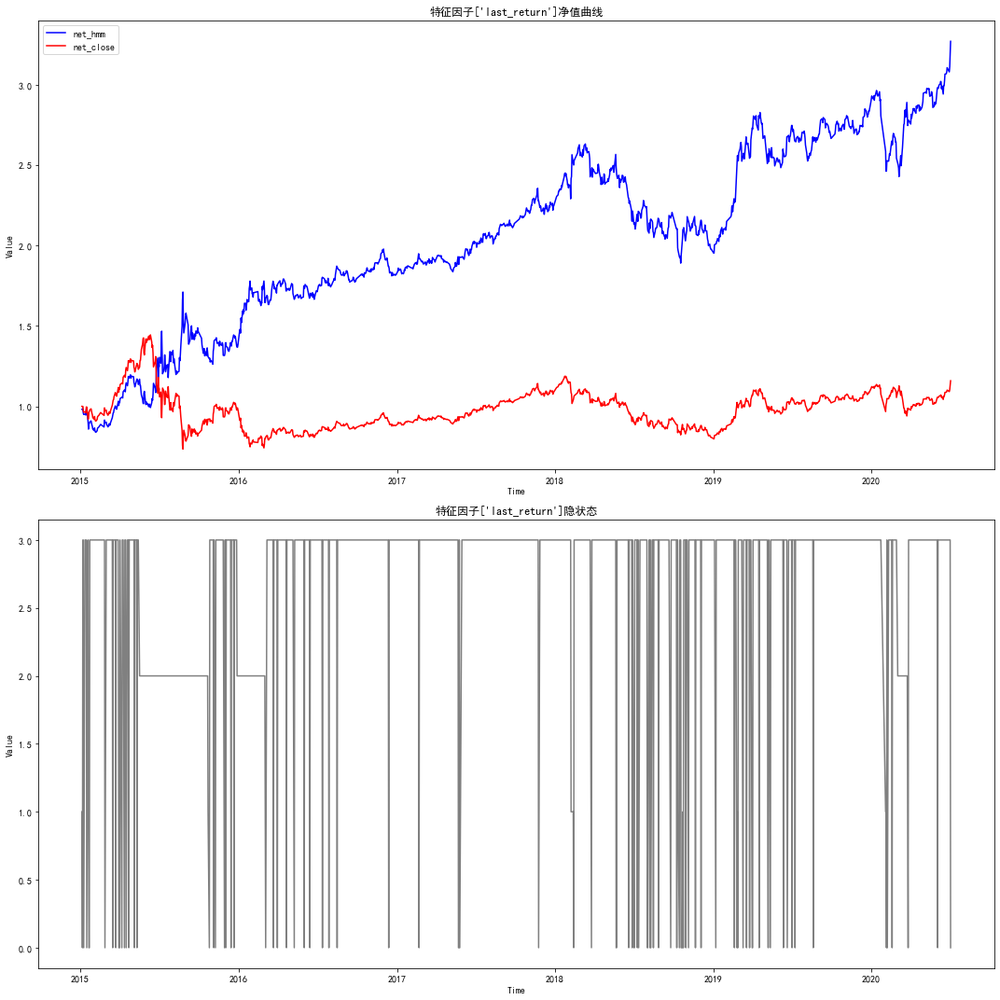

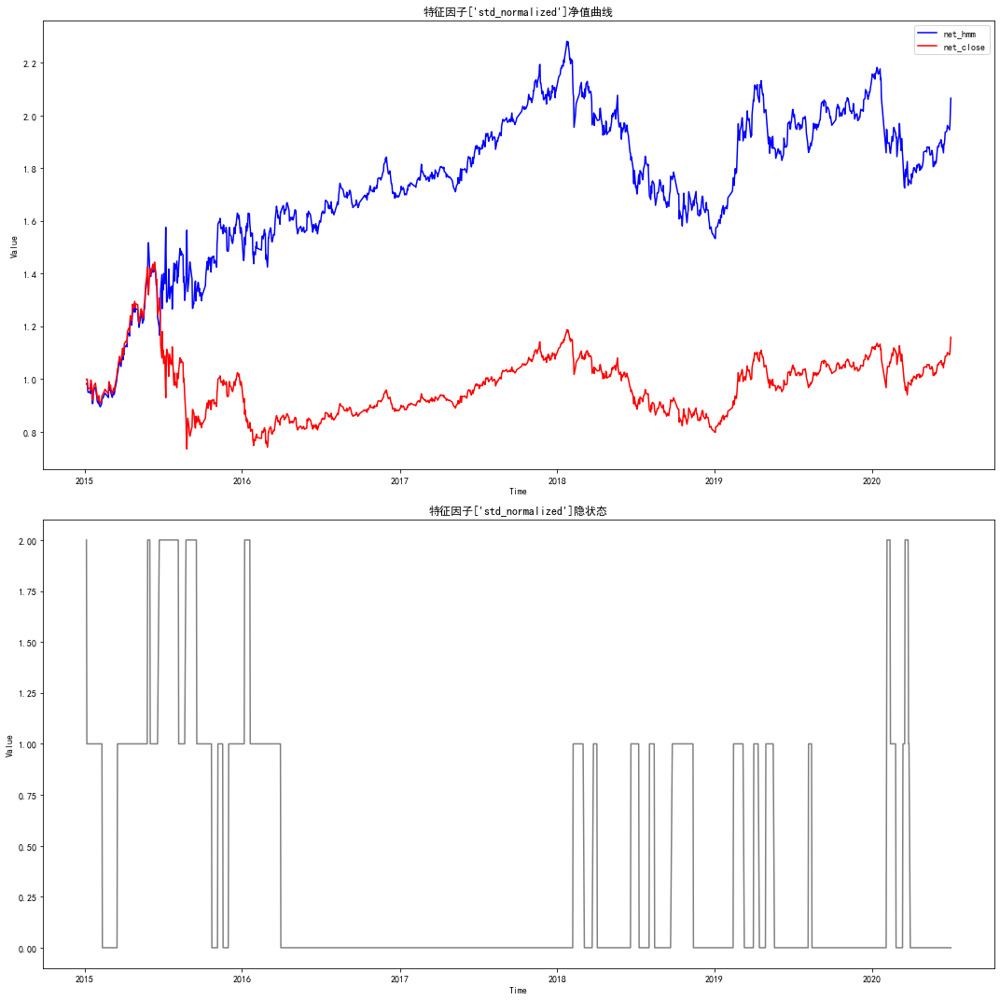

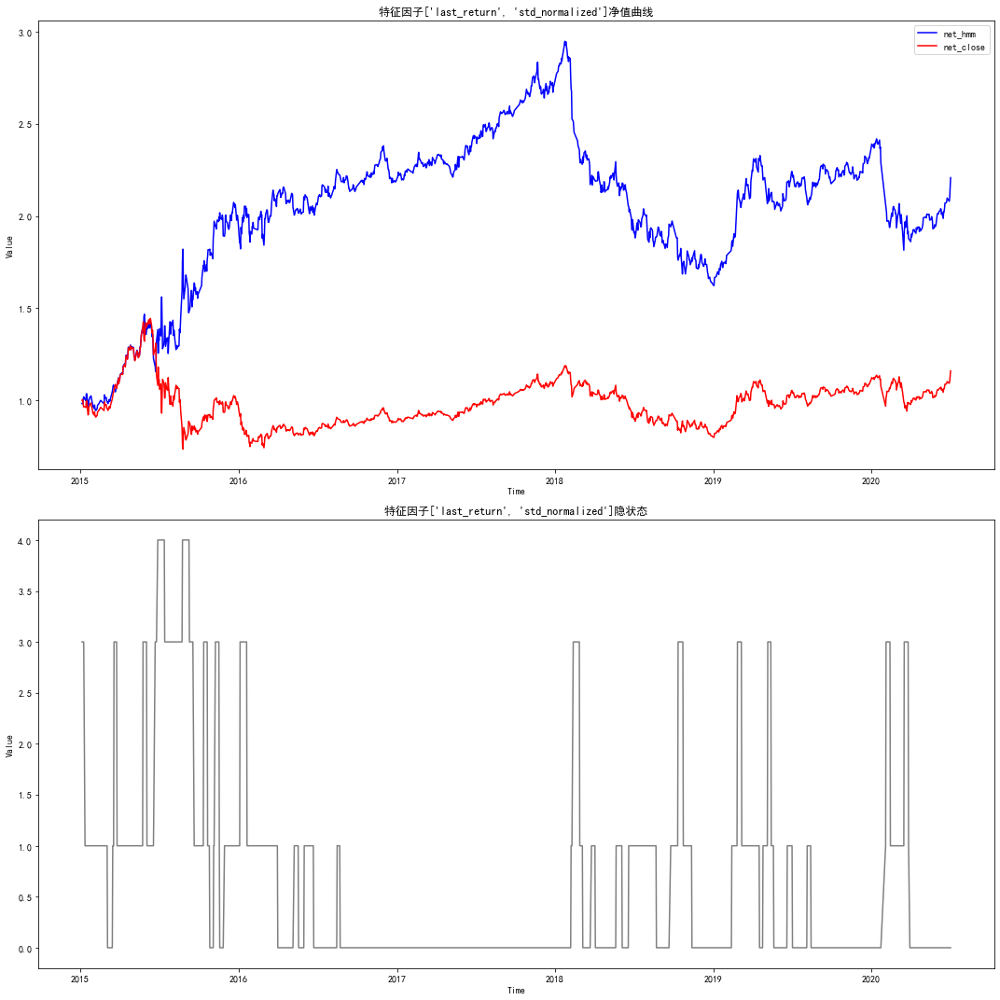

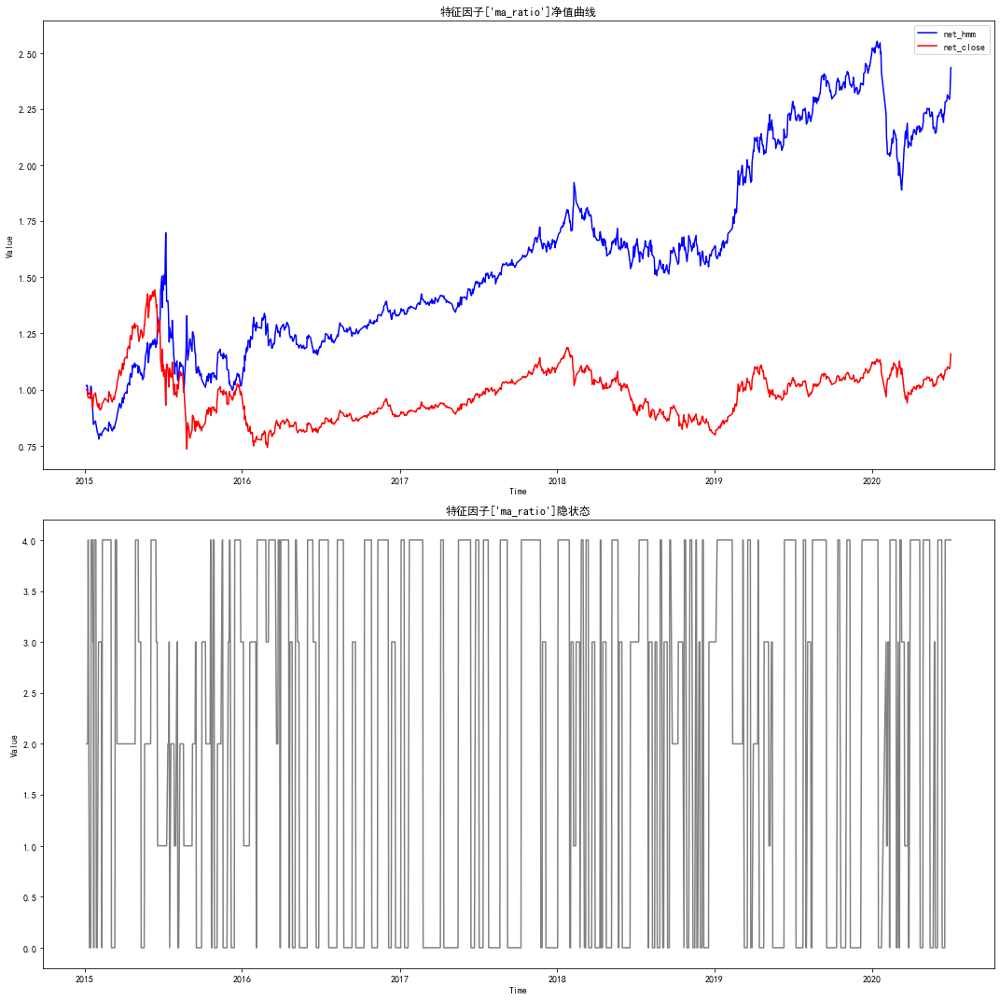

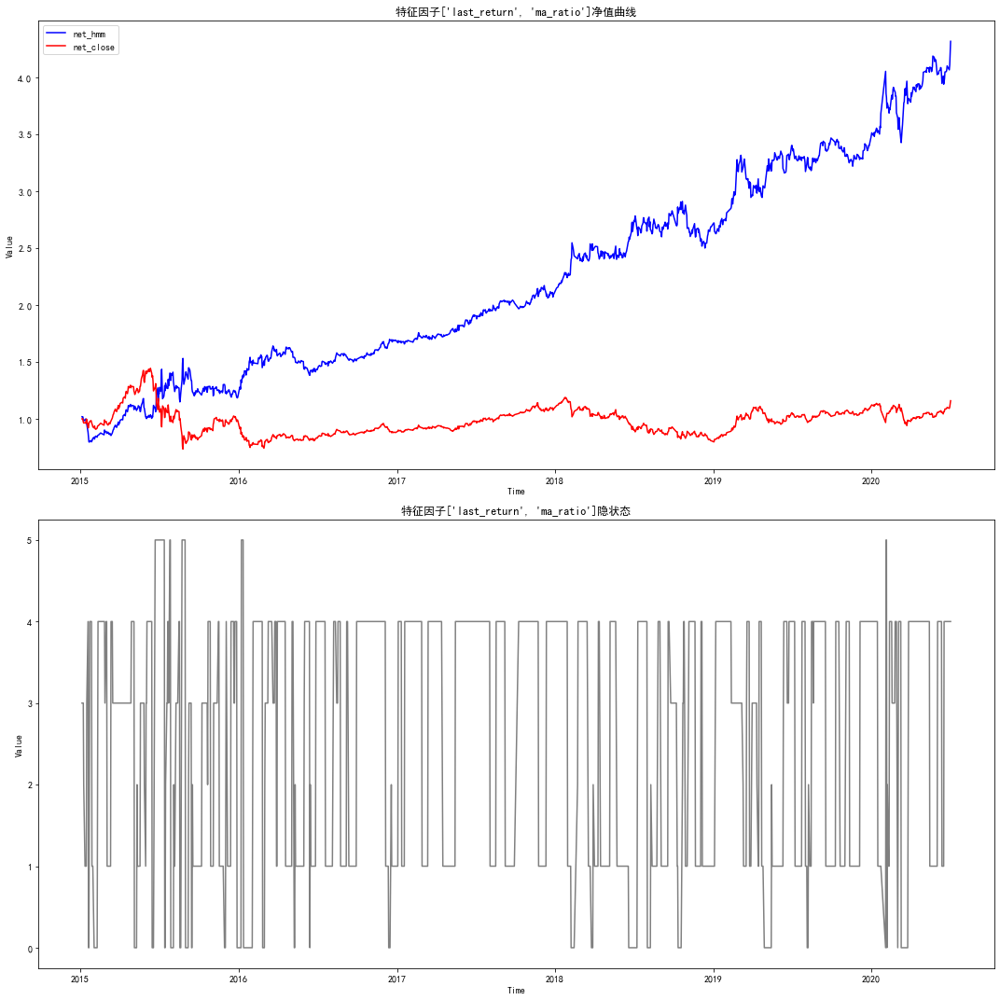

...

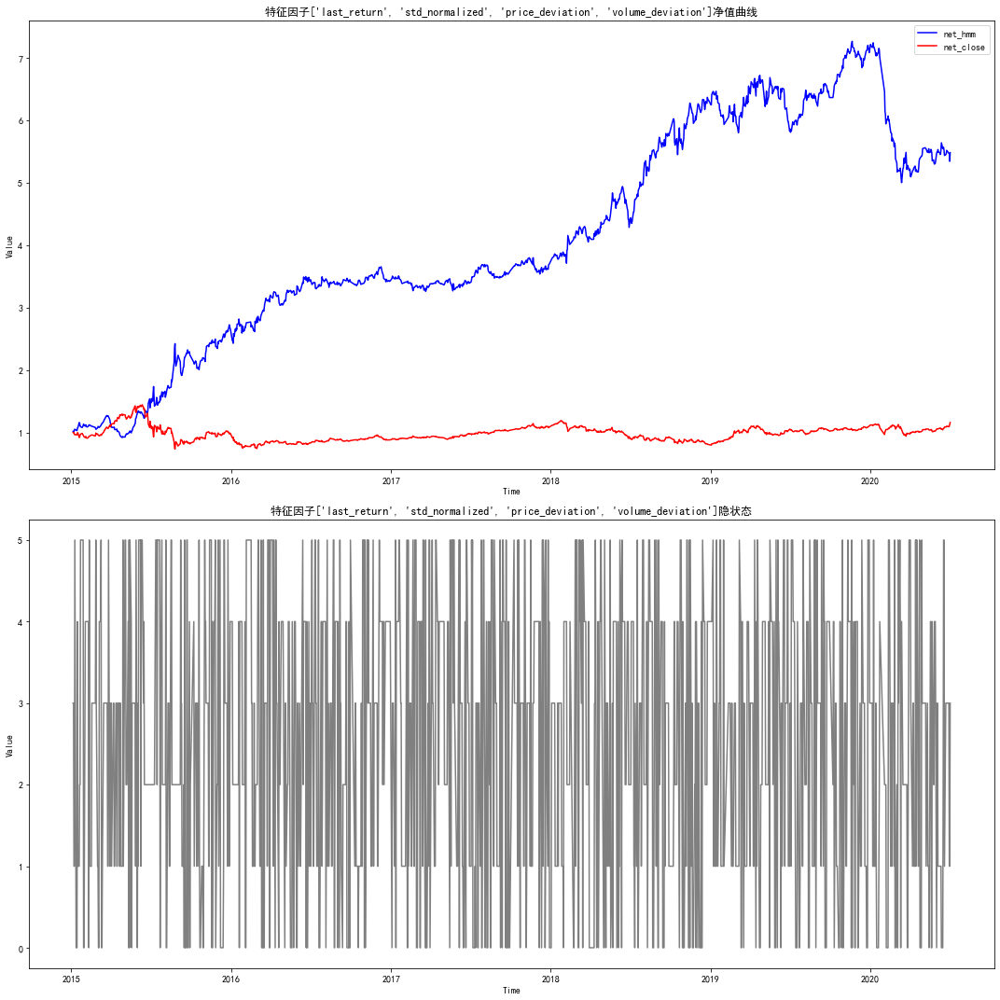

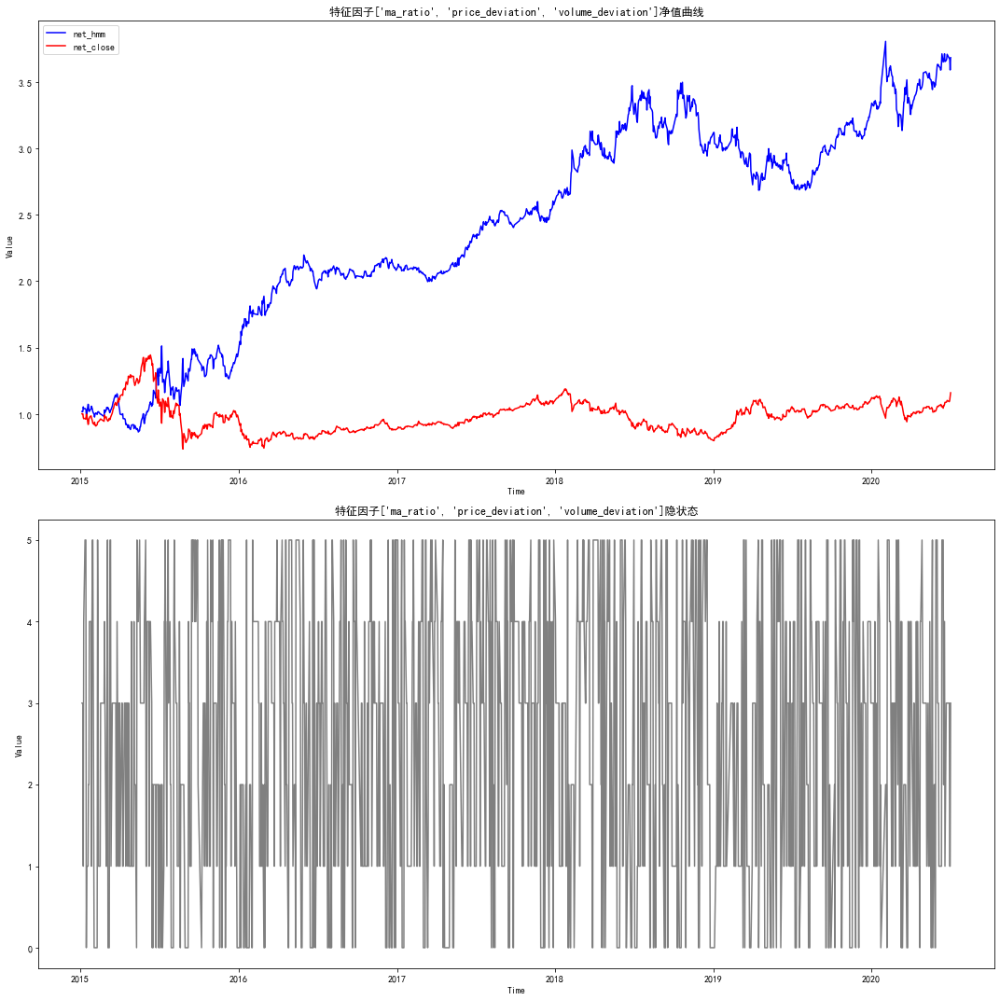

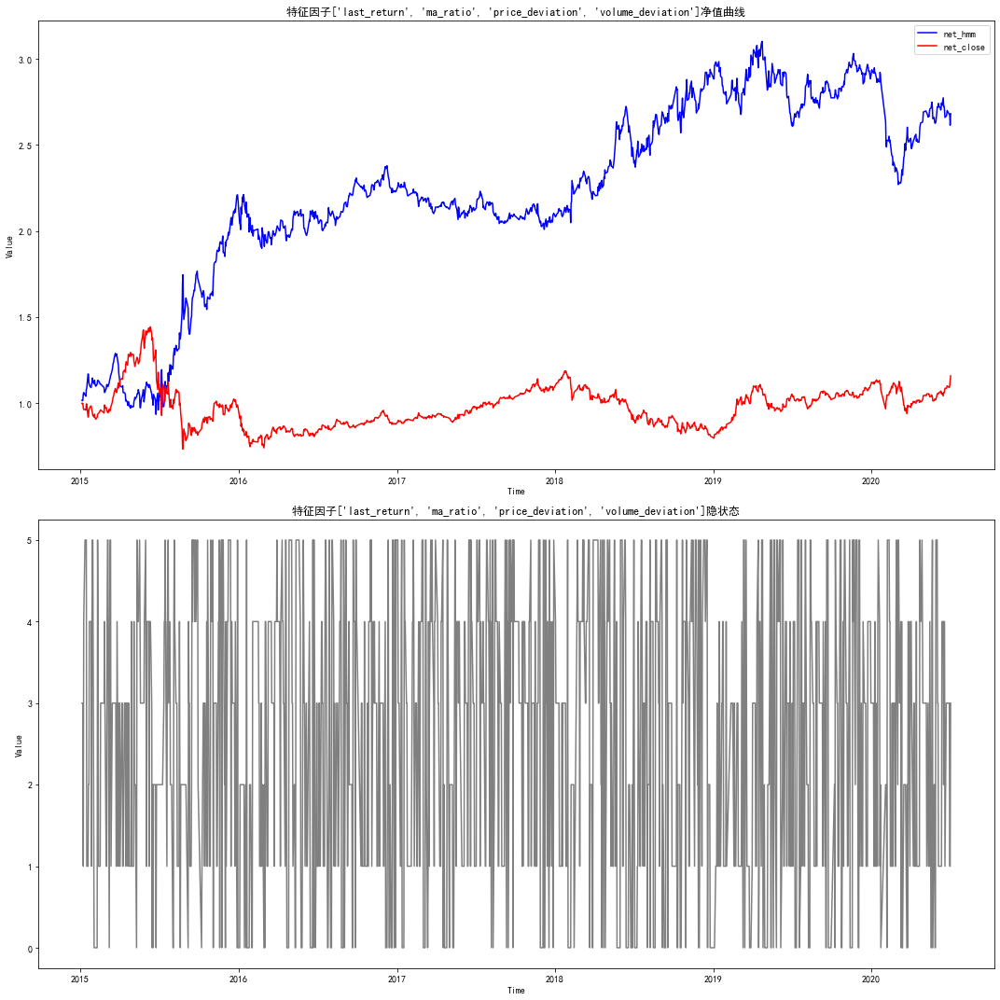

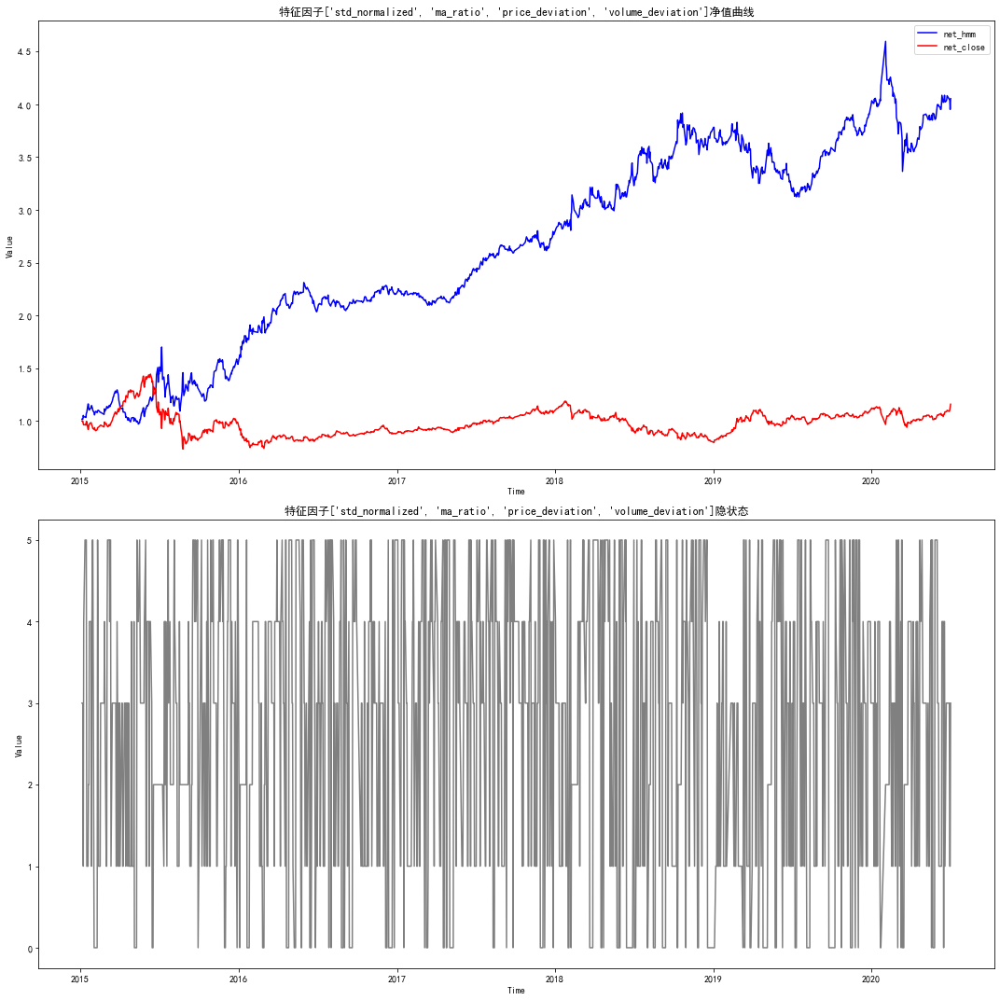

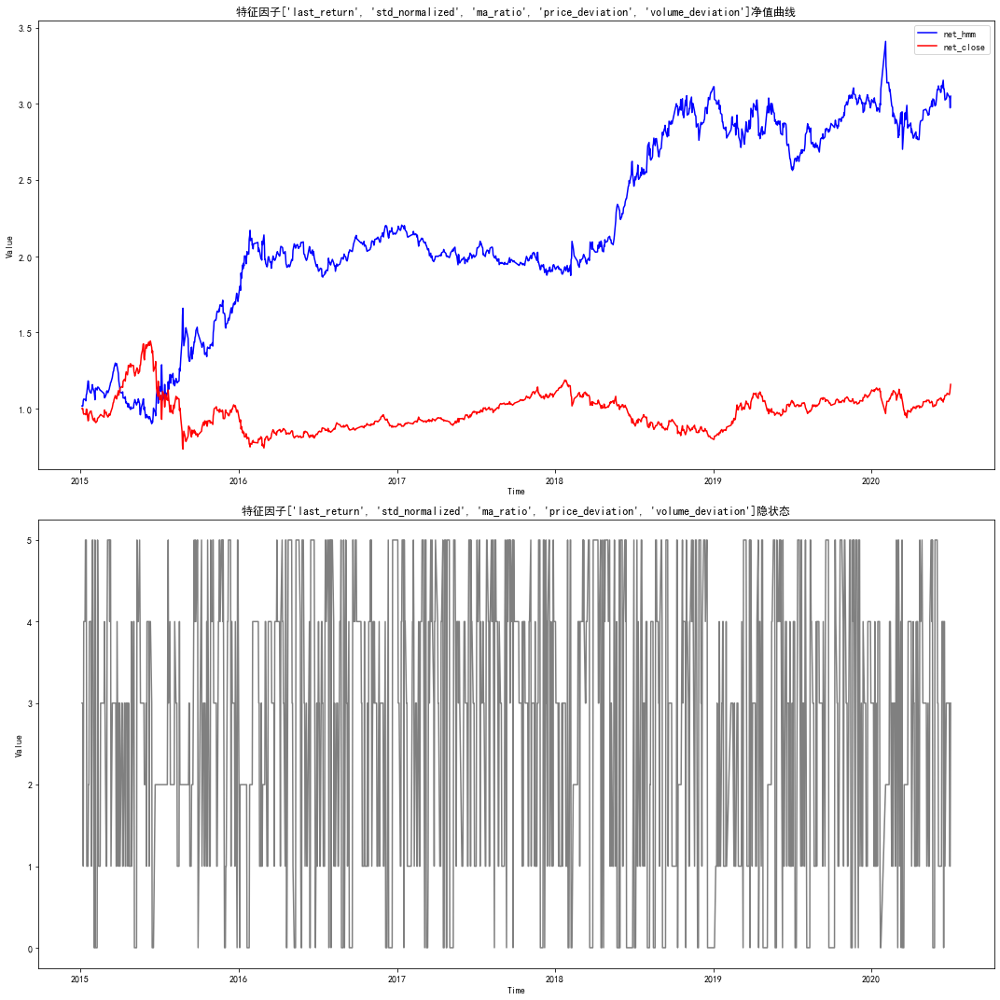

In [87]:
in_sample_dataset = dataset[dataset.index >= '2015-01-01']
for feature_lst in all_feature_lst:
    model, hidden_states, long_states, short_states, random_states = get_longshort_state_from_cumsum(in_sample_dataset, feature_lst, max_states)
    print('特征因子：', feature_lst)
    print('做多隐状态：%s, 做空隐状态：%s, 空仓隐状态：%s' %(long_states, short_states, random_states))
    strategy_obj = HmmStrategy(leverage=1, fee=0.0002, test_df=in_sample_dataset, cols_features=feature_lst,
                               hmm_model=model, long_states=long_states,  random_states=random_states, short_states=short_states,
                              hidden_states_lst=hidden_states, insample=True)
    strategy_obj.run_test()

## 特征因子样本外回测

特征因子： ['last_return']
做多隐状态：[0, 1, 4], 做空隐状态：[2, 3], 空仓隐状态：[]
年化收益: -0.1669048098495236
夏普比率: -0.6370848568546056
最大回撤: 0.7027646684140674
特征因子： ['std_normalized']
做多隐状态：[0], 做空隐状态：[1], 空仓隐状态：[]
年化收益: -0.13780047632710846
夏普比率: -0.5181726376347822
最大回撤: 0.6948347249418093
特征因子： ['last_return', 'std_normalized']
做多隐状态：[3, 4], 做空隐状态：[2], 空仓隐状态：[0, 1]
年化收益: -0.10817422244076291
夏普比率: -0.39509724012989583
最大回撤: 0.5531260340248798
特征因子： ['ma_ratio']
做多隐状态：[2, 5], 做空隐状态：[0, 1, 3, 4], 空仓隐状态：[]
年化收益: -0.13824258062180894
夏普比率: -0.5135556746532756
最大回撤: 0.717840791356283
特征因子： ['last_return', 'ma_ratio']
做多隐状态：[1, 3, 4], 做空隐状态：[0, 2, 5], 空仓隐状态：[]
年化收益: -0.22052484585924104
夏普比率: -0.8590184869057835
最大回撤: 0.7994286123912334
特征因子： ['std_normalized', 'ma_ratio']
做多隐状态：[1, 3, 4, 5], 做空隐状态：[0, 2], 空仓隐状态：[]
年化收益: -0.11261508960722566
夏普比率: -0.41755440403384503
最大回撤: 0.7402658173588976
特征因子： ['last_return', 'std_normalized', 'ma_ratio']
做多隐状态：[2, 3], 做空隐状态：[0, 1, 4], 空仓隐状态：[]
年化收益: -0.2555902280265208

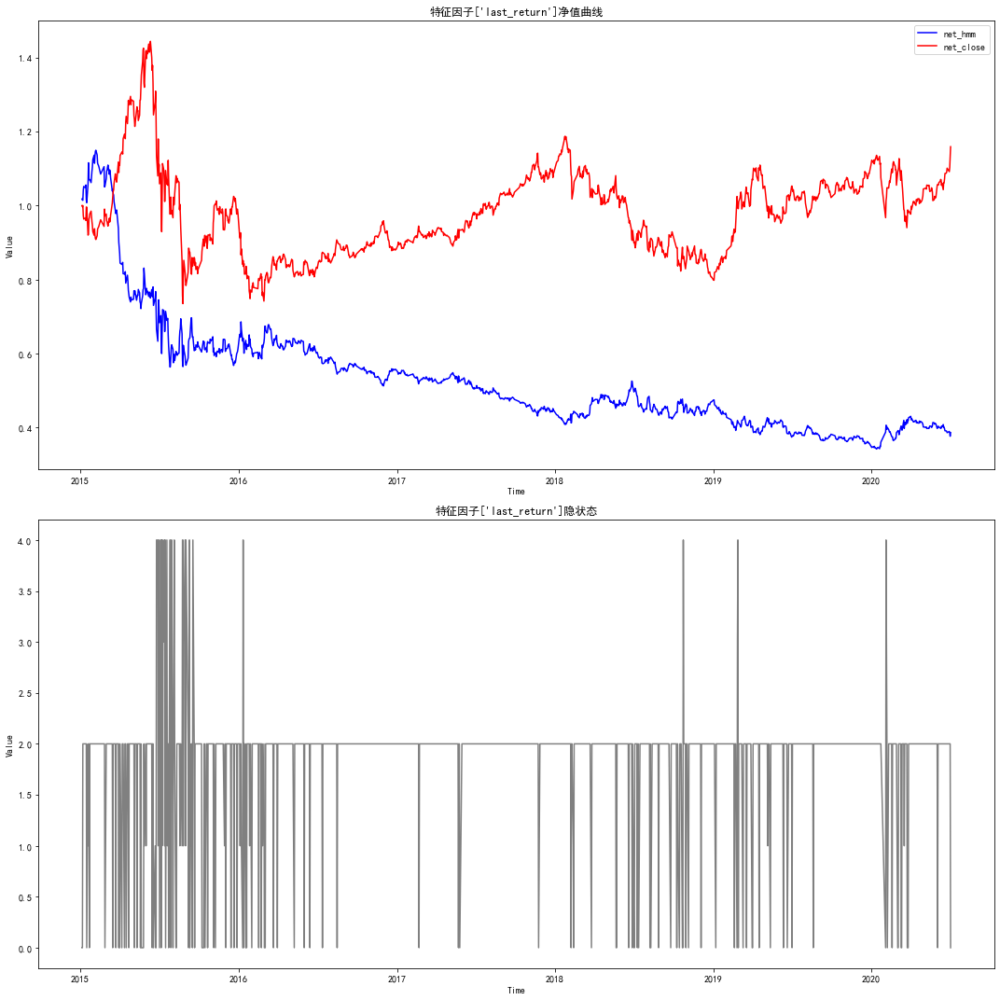

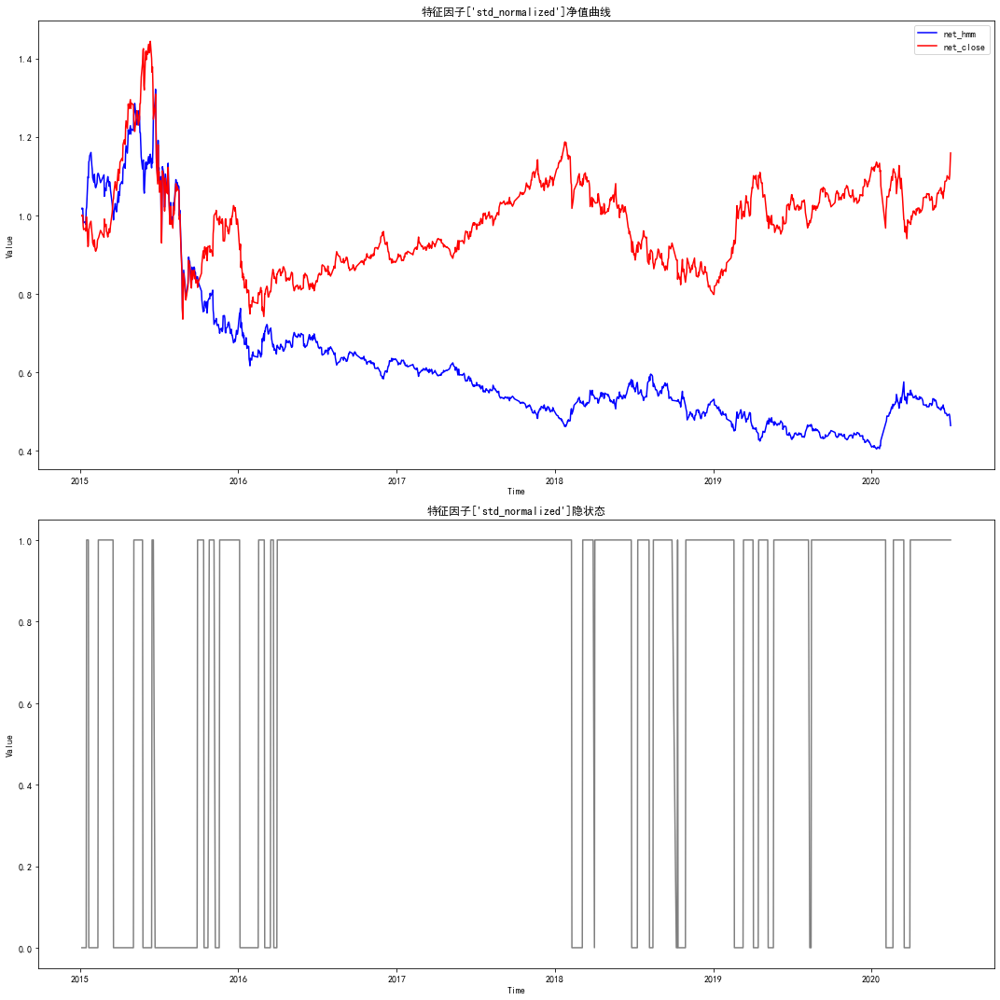

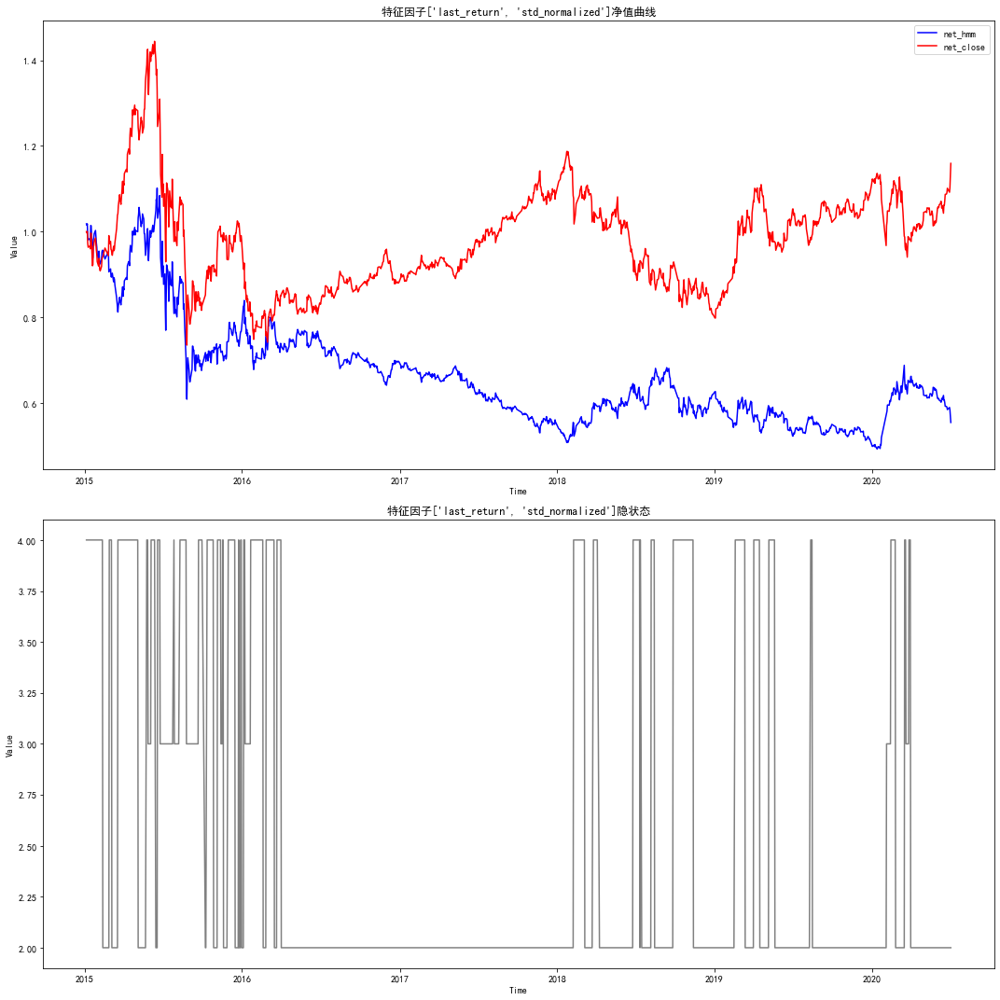

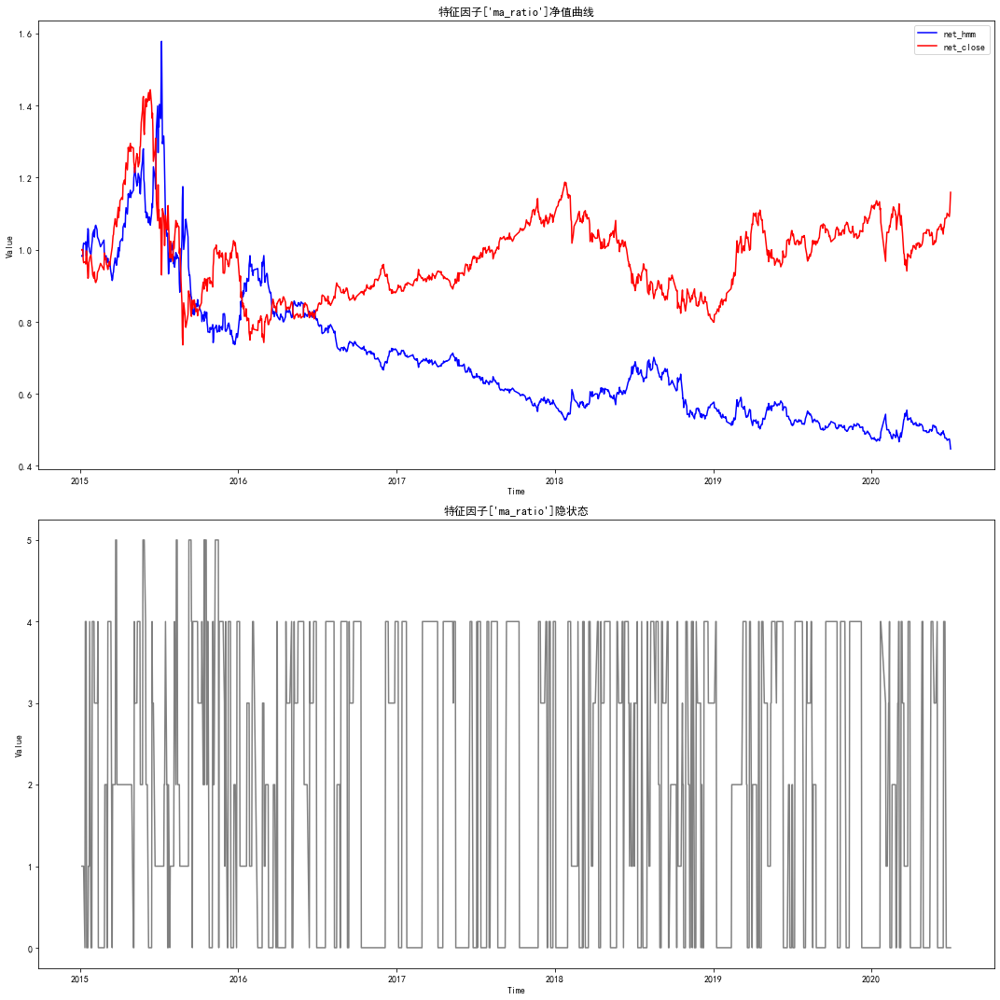

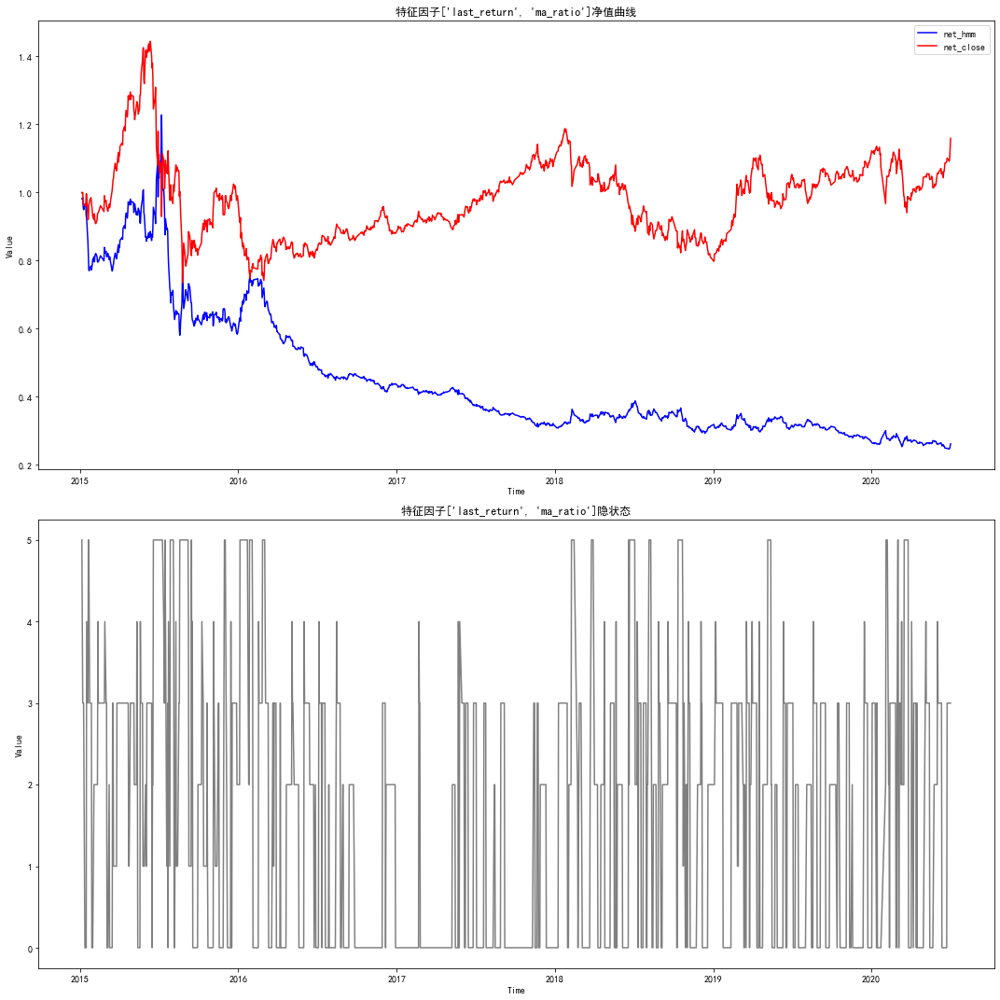

...

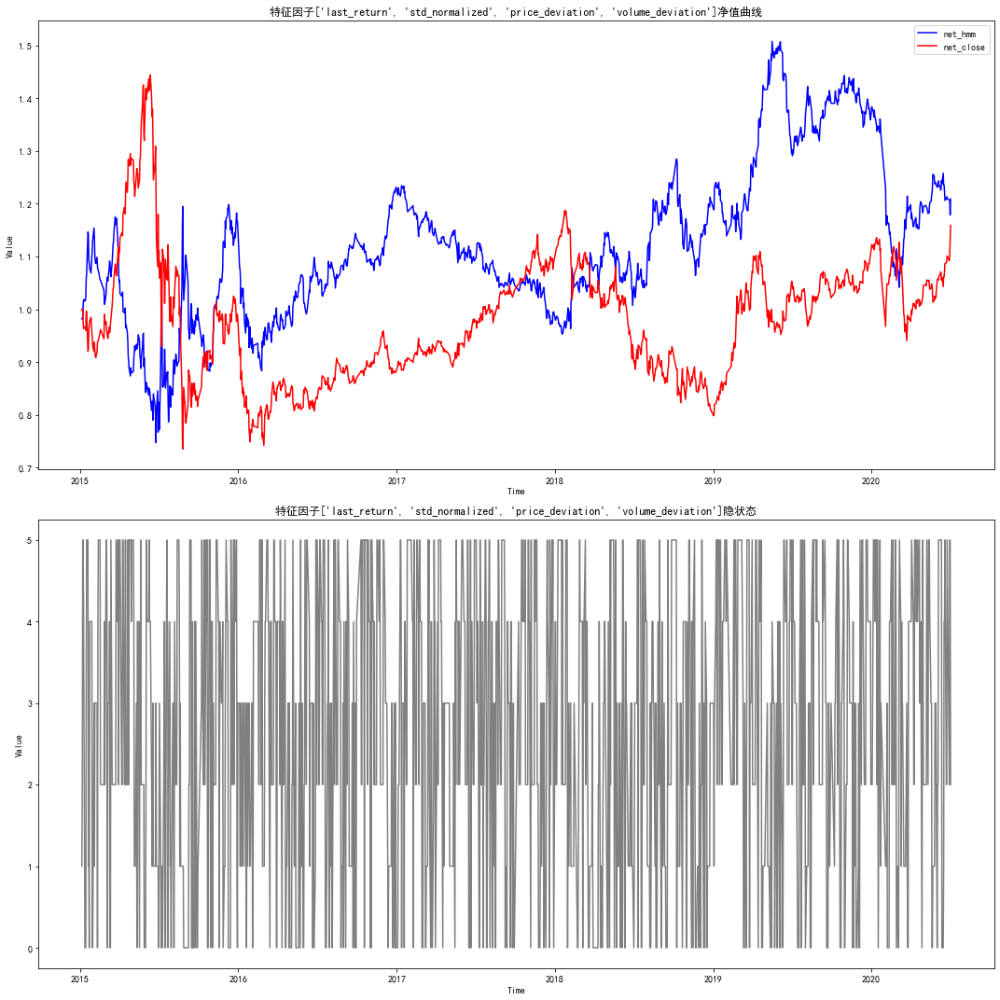

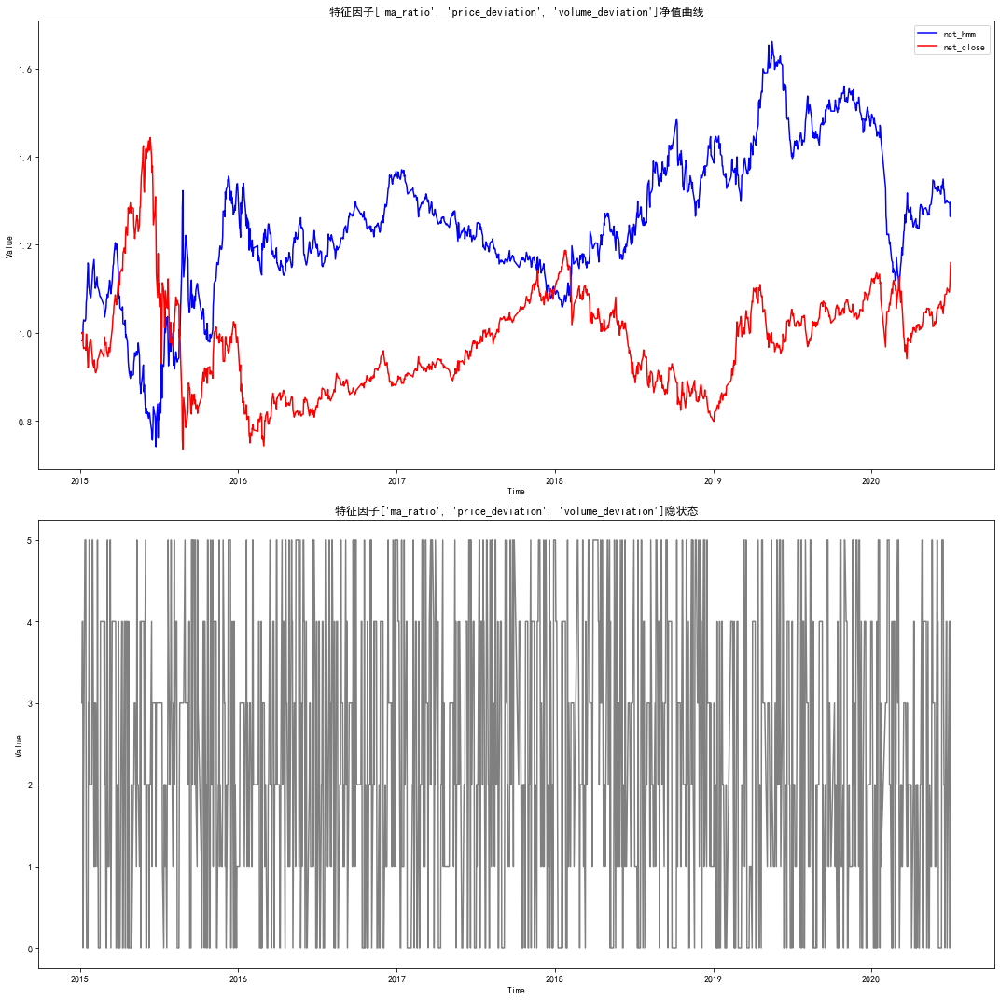

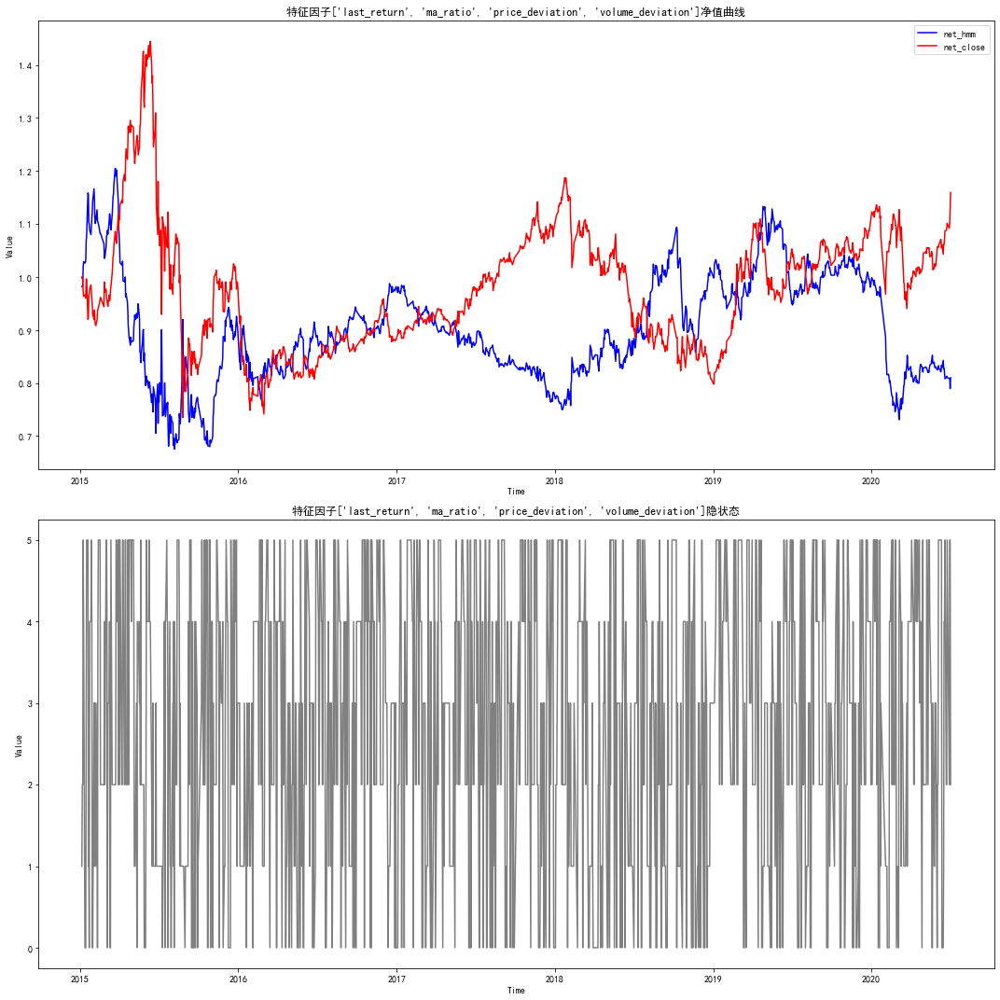

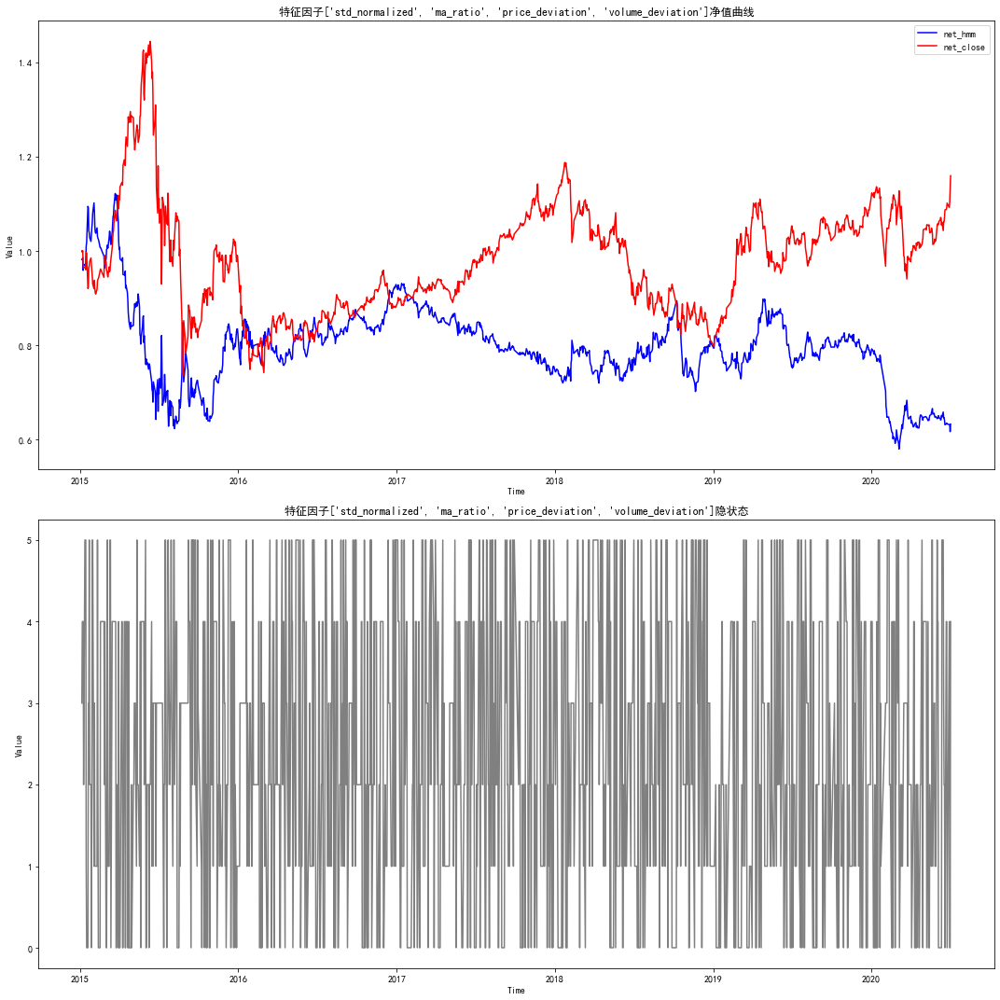

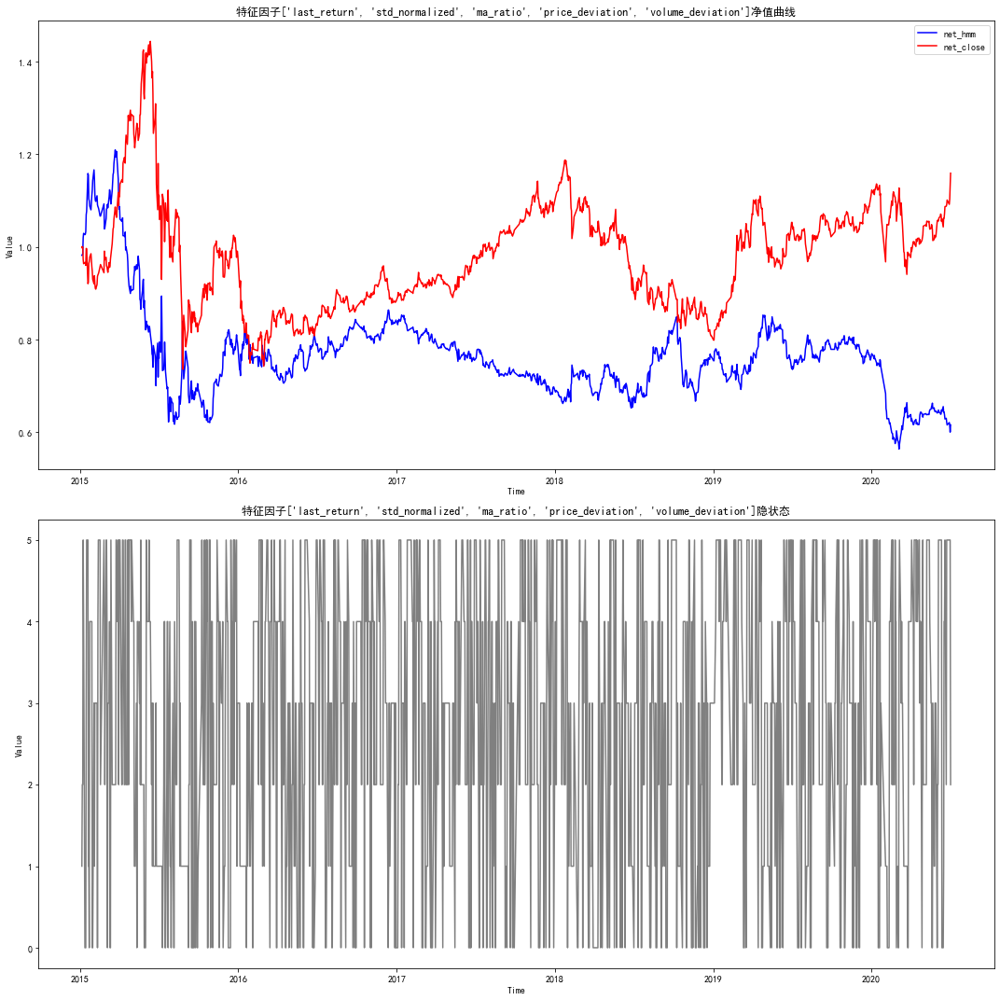

In [88]:
in_sample_dataset = dataset[dataset.index < '2015-01-01']
out_sample_dataset = dataset[dataset.index >= '2015-01-01']
for feature_lst in all_feature_lst:
    model, hidden_states, long_states, short_states, random_states = get_longshort_state_from_cumsum(in_sample_dataset, feature_lst, max_states)
    print('特征因子：', feature_lst)
    print('做多隐状态：%s, 做空隐状态：%s, 空仓隐状态：%s' %(long_states, short_states, random_states))
    strategy_obj = HmmStrategy(leverage=1, fee=0.0002, test_df=out_sample_dataset, cols_features=feature_lst,
                               hmm_model=model, long_states=long_states,  random_states=random_states, short_states=short_states,
                              hidden_states_lst=hidden_states, insample=False)
    strategy_obj.run_test()

In [354]:
dataset = dataset.dropna()

In [355]:
dataset

,last_return,std_normalized,ma_ratio,price_deviation,volume_deviation,future_return,high,low,close,volume,open,date_time,close_1
Date,,,,,,,,,,,,,
2017-01-11,-0.014074,0.074583,-0.084358,-1.043067,-0.723571,0.003034,918.00,895.48,905.750000,12138.492906,903.010000,2017-01-11,903.010000
2017-01-12,0.003034,0.078397,-0.074358,-0.882834,-0.940678,-0.139321,923.66,760.00,779.560000,62866.223071,905.750000,2017-01-12,905.750000
2017-01-13,-0.139321,0.099824,-0.220088,-1.807045,0.925042,0.032621,831.18,735.00,804.990000,35863.467828,779.560000,2017-01-13,779.560000
2017-01-14,0.032621,0.108756,-0.154898,-1.233238,-0.236870,0.027615,832.39,775.61,827.220000,25871.211334,804.990000,2017-01-14,804.990000
2017-01-15,0.027615,0.108145,-0.098381,-0.828234,-0.738535,-0.013745,838.54,800.03,815.850000,12533.896904,827.220000,2017-01-15,827.220000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-29,-0.033836,0.043615,0.026859,0.632805,0.624957,0.014357,13629.00,12972.00,13450.000000,3997.730829,13259.636970,2020-10-29,13259.636970
2020-10-30,0.014357,0.033452,0.028178,0.866776,-0.569502,0.009442,13673.00,13120.00,13577.000000,4558.961015,13450.000000,2020-10-30,13450.000000
2020-10-31,0.009442,0.018867,0.025219,1.371247,-0.370846,0.020770,14055.00,13425.00,13859.000000,9057.493287,13577.000000,2020-10-31,13577.000000


In [356]:
# Split the data on sets
train_edate = '2020-11-01 00:00:00'
train_ind = int(np.where(dataset.index == train_edate)[0])
train_set = dataset[cols_features].values[:train_ind]
test_set = dataset[cols_features].values[train_ind:]
test_df = dataset[train_ind:]


In [357]:
train_ind

141

<Figure size 1440x720 with 0 Axes>

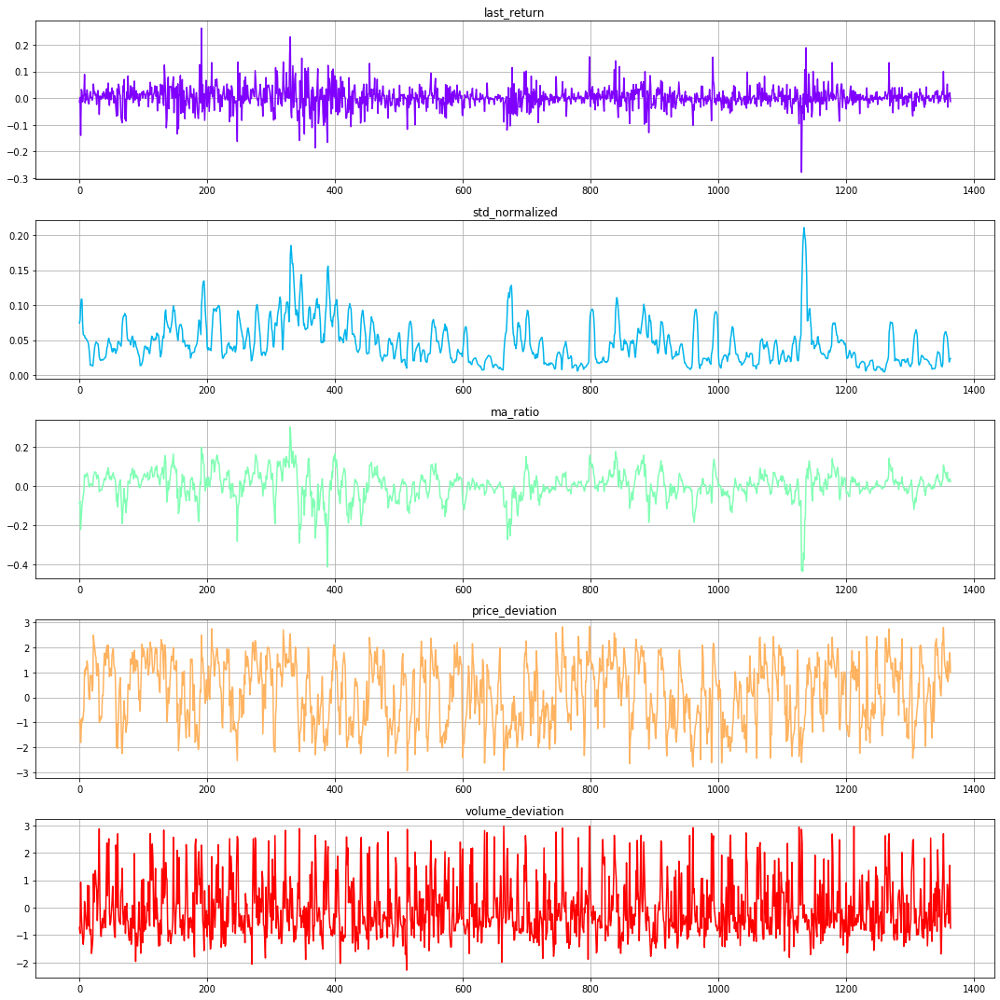

In [358]:
 # Plot features 五个新的时间序列
plt.figure(figsize=(20, 10))
fig, axs = plt.subplots(len(cols_features), 1, figsize=(15, 15))
colours = cm.rainbow(np.linspace(0, 1, len(cols_features)))
for i in range(0, len(cols_features)):
    axs[i].plot(dataset.reset_index()[cols_features[i]], color=colours[i])
    axs[i].set_title(cols_features[i])
    axs[i].grid(True)

plt.tight_layout()

In [359]:
# General plots of hidden states
def plot_hidden_states(model, data, X, column_price):
    plt.figure(figsize=(15, 15))
    fig, axs = plt.subplots(model.n_components, 3, figsize=(15, 15))
    colours = cm.prism(np.linspace(0, 1, model.n_components))
    hidden_states = model.predict(X)
    print(hidden_states)
    for i, (ax, colour) in enumerate(zip(axs, colours)):
        mask = hidden_states == i
#         print(mask)
#         print(data['future_return'][mask])
        ax[0].plot(data.index, data[column_price], c='grey')
        ax[0].plot(data.index[mask], data[column_price][mask], '.', c=colour)
        ax[0].set_title('{0}th hidder state'.format(i))
        ax[0].grid(True)

        ax[1].hist(data['future_return'][mask], bins=30)
        ax[1].set_xlim([-0.1, 0.1])
        ax[1].set_title('future return distrbution at {0}th hidder state'.format(i))
        ax[1].grid(True)

        ax[2].plot(data['future_return'][mask].cumsum(), c=colour)
        ax[2].set_title('cummulative future return at {0}th hidden state'.format(i))
        ax[2].grid(True)
    plt.tight_layout()

In [360]:
hidden_state_num = 6
model = get_best_hmm_model(train_set, hidden_state_num)

In [361]:
model.n_components

6

[0 0 5 0 0 0 0 4 1 1 1 1 1 1 4 4 4 4 4 4 4 4 3 3 3 3 3 1 1 1 1 5 0 0 0 0 4
 4 1 3 3 1 3 3 3 3 3 1 1 1 1 3 3 3 1 1 1 5 5 0 5 0 4 4 4 5 5 5 0 0 4 5 0 5
 0 0 4 4 4 4 1 1 1 3 1 1 3 1 1 1 1 1 1 4 4 4 4 3 3 3 3 3 3 1 1 1 3 3 1 1 1
 3 3 3 3 1 1 1 3 3 3 3 1 1 1 4 4 3 3 3 3 1 2 2 2 2 5 5 0 4 4]


<Figure size 1080x1080 with 0 Axes>

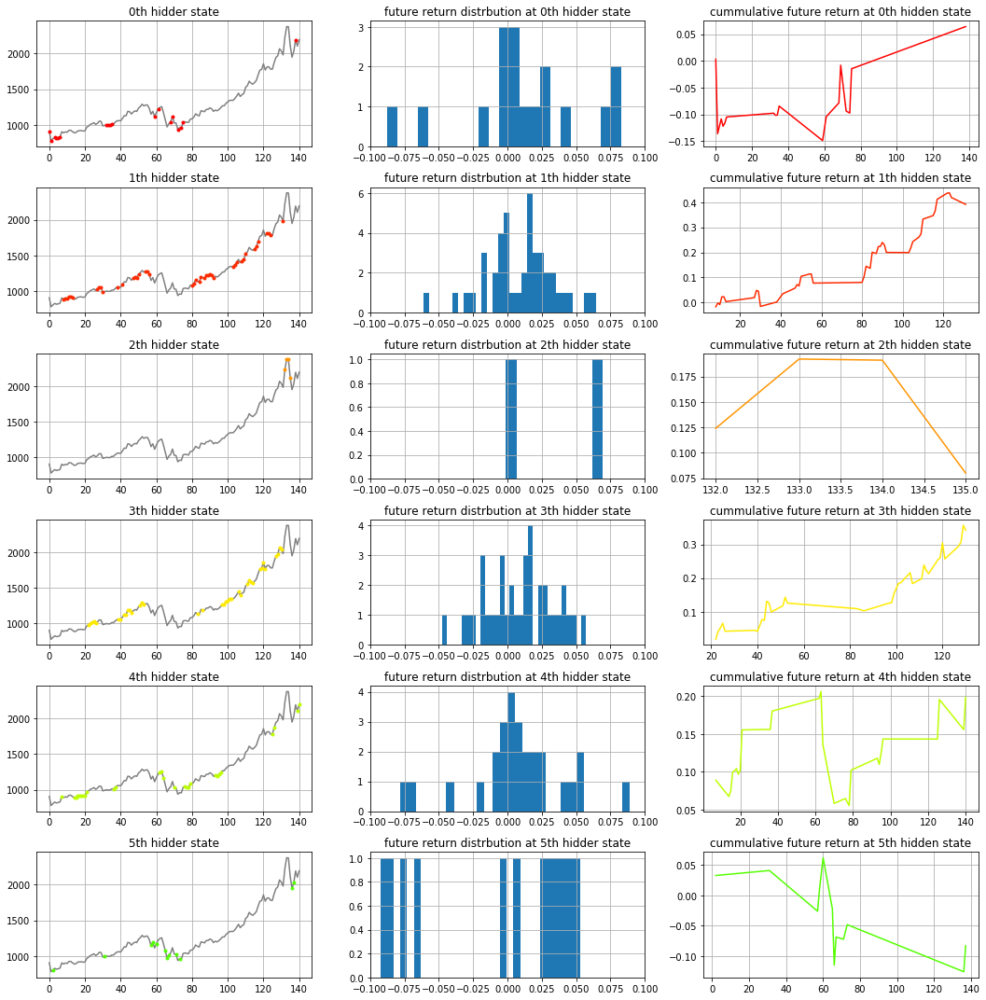

In [362]:
plot_hidden_states(model, dataset[:train_ind].reset_index(), train_set, column_price)

In [317]:
# 第二个关键 是通过特征来研究每个状态。
# 在此之后，我们可以将这两个事件（未来走势和当前状态）联系起来。
# 让我们为每个状态的特征编写代码和可视化。
def mean_confidence_interval(vals, confidence):
    a = 1.0 * np.array(vals)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m-h, m, m+h


def compare_hidden_states(hmm_model, cols_features, conf_interval, iters=1000):
    plt.figure(figsize=(15, 15))
    fig, axs = plt.subplots(len(cols_features), hmm_model.n_components, figsize=(15, 15))
    colours = cm.prism(np.linspace(0, 1, hmm_model.n_components))
    for i in range(0, hmm_model.n_components):
        mc_df = pd.DataFrame()

        # Samples generation
        for j in range(0, iters):
            row = np.transpose(hmm_model._generate_sample_from_state(i))
            mc_df = mc_df.append(pd.DataFrame(row).T)
        mc_df.columns = cols_features
        for k in range(0, len(mc_df.columns)):
            axs[k][i].hist(mc_df[cols_features[k]], color=colours[i])
            axs[k][i].set_title(cols_features[k] + ' (state ' + str(i) + '): ' +
                                str(np.round(mean_confidence_interval(mc_df[cols_features[k]], conf_interval), 3)))
            axs[k][i].grid(True)
    plt.tight_layout()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


<Figure size 1080x1080 with 0 Axes>

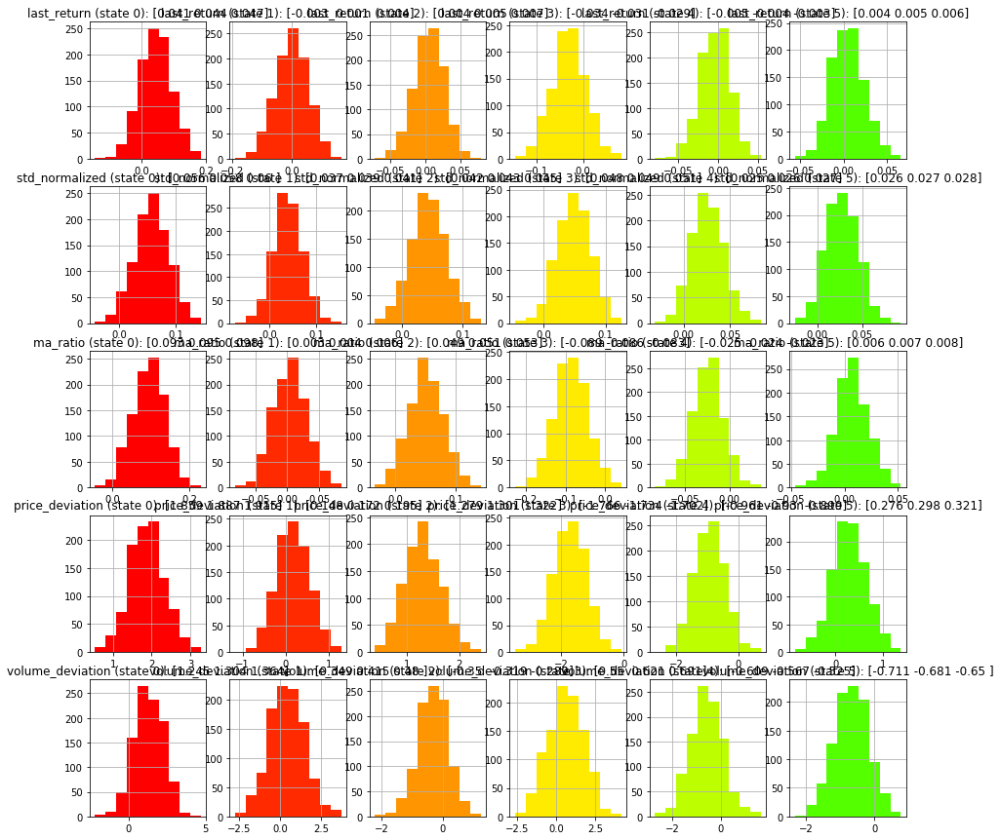

In [318]:
compare_hidden_states(hmm_model=model, cols_features=cols_features, conf_interval=0.95)

In [319]:
# 搭建策略
# 状态为#0时： 做空
# 状态为#1时： 空仓
# 状态为#2时： 做多

In [320]:
dataset[:train_ind]


,last_return,std_normalized,ma_ratio,price_deviation,volume_deviation,future_return,high,low,close,volume,open,date_time,close_1
Date,,,,,,,,,,,,,
2019-01-14,-0.032798,0.048200,-0.096344,-1.823194,-0.587773,0.047458,3799.400000,3580.000000,3749.900000,14822.060969,3580.0,2019-01-14,3580.0
2019-01-15,0.047458,0.050140,-0.041150,-0.788274,-0.122836,-0.025067,3780.874734,3623.100000,3655.900000,13293.390883,3749.9,2019-01-15,3749.9
2019-01-16,-0.025067,0.052014,-0.056840,-1.034008,-0.335720,0.006811,3759.894844,3642.358936,3680.800000,13119.247466,3655.9,2019-01-16,3655.9
2019-01-17,0.006811,0.053447,-0.042110,-0.756049,-0.372452,0.009319,3725.000000,3606.200000,3715.100000,10673.827380,3680.8,2019-01-17,3680.8
2019-01-18,0.009319,0.054046,-0.027219,-0.490274,-0.805975,-0.010268,3723.900000,3652.388368,3676.953079,5648.970498,3715.1,2019-01-18,3715.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,0.002909,0.028626,0.003890,0.136422,-0.432810,0.005206,7300.000000,7113.300000,7278.700000,3983.951890,7241.0,2019-12-27,7241.0
2019-12-28,0.005206,0.013429,0.000647,0.048192,-0.461215,0.008229,7390.000000,7279.200000,7338.600000,2568.077737,7278.7,2019-12-28,7278.7
2019-12-29,0.008229,0.013569,0.008546,0.635256,-1.218717,0.010533,7551.600000,7311.600000,7415.900000,2488.165365,7338.6,2019-12-29,7338.6


No handles with labels found to put in legend.


annR: -0.583952116423315
sharp: -1.8182511690125356
Max drawdown: 0.5981441413632591


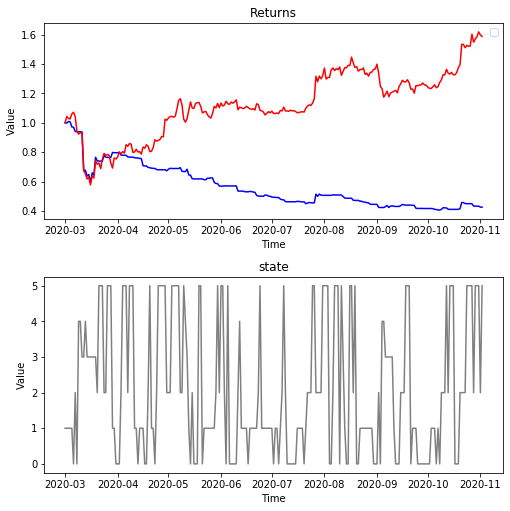